In [343]:
import nflfastpy
import nfl_data_py as nfl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

sns.set_style("darkgrid")

In [344]:
years = [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

In [ ]:
nfl.i

In [403]:
schedule.head()

,game_id,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,...,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,datetime
0,2015_01_PIT_NE,2015,REG,1,2015-09-10,Thursday,20:30,PIT,21.0,NE,...,00-0022924,00-0019596,Ben Roethlisberger,Tom Brady,Mike Tomlin,Bill Belichick,Carl Cheffers,BOS00,Gillette Stadium,2015-09-10 20:30:00
1,2015_01_IND_BUF,2015,REG,1,2015-09-13,Sunday,13:00,IND,14.0,BUF,...,00-0029668,00-0028118,Andrew Luck,Tyrod Taylor,Chuck Pagano,Rex Ryan,John Parry,BUF00,Ralph Wilson Stadium,2015-09-13 13:00:00
2,2015_01_GB_CHI,2015,REG,1,2015-09-13,Sunday,13:00,GB,31.0,CHI,...,00-0023459,00-0024226,Aaron Rodgers,Jay Cutler,Mike McCarthy,John Fox,Craig Wrolstad,CHI98,Soldier Field,2015-09-13 13:00:00
3,2015_01_KC_HOU,2015,REG,1,2015-09-13,Sunday,13:00,KC,27.0,HOU,...,00-0023436,00-0026625,Alex Smith,Brian Hoyer,Andy Reid,Bill O'Brien,Peter Morelli,HOU00,NRG Stadium,2015-09-13 13:00:00
4,2015_01_CAR_JAX,2015,REG,1,2015-09-13,Sunday,13:00,CAR,20.0,JAX,...,00-0027939,00-0031407,Cam Newton,Blake Bortles,Ron Rivera,Gus Bradley,Ron Torbert,JAX00,EverBank Field,2015-09-13 13:00:00


In [345]:
schedule = nfl.import_schedules(years).reset_index(drop=True)

### Column Descriptions
<div style="overflow-x:auto;">
  <table>
    <tr>
      <th>Column Name</th>
      <th>Description</th>
    </tr>
    <tr>
      <td>game_id</td>
      <td>Unique identifier for each game</td>
    </tr>
    <tr>
      <td>season</td>
      <td>The season in which the game was played</td>
    </tr>
    <tr>
      <td>game_type</td>
      <td>'REG', 'WC', 'DIV', 'CON', 'SB'</td>
    </tr>
    <tr>
      <td>week</td>
      <td>Week of the NFL season</td>
    </tr>
    <tr>
      <td>gameday</td>
      <td>yyyy-MM-DD</td>
    </tr>
    <tr>
      <td>weekday</td>
      <td>'Thursday', 'Sunday', 'Monday', 'Saturday'</td>
    </tr>
    <tr>
      <td>gametime</td>
      <td>HH:mm</td>
    </tr>
    <tr>
      <td>away_team</td>
      <td>'BUF', 'NO', 'CLE', etc</td>
    </tr>
    <tr>
      <td>away_score</td>
      <td>Score of the visiting team</td>
    </tr>
    <tr>
      <td>home_team</td>
      <td>'BUF', 'NO', 'CLE', etc</td>
    </tr>
    <tr>
      <td>home_score</td>
      <td>Score of the home team</td>
    </tr>
    <tr>
      <td>location</td>
      <td>Location of the game ['Home', 'Neutral']</td>
    </tr>
    <tr>
      <td>result</td>
      <td>Spread outcome of the game from home team perspective (e.g., +1, -10)</td>
    </tr>
    <tr>
      <td>total</td>
      <td>Total points scored in the game</td>
    </tr>
    <tr>
      <td>overtime</td>
      <td>Indicates if the game went into overtime</td>
    </tr>
    <tr>
      <td>old_game_id</td>
      <td>Previous game identifier</td>
    </tr>
    <tr>
      <td>gsis</td>
      <td>Game System Information System (GSIS) identifier</td>
    </tr>
    <tr>
      <td>nfl_detail_id</td>
      <td>NFL Detail identifier</td>
    </tr>
    <tr>
      <td>pfr</td>
      <td>Pro Football Reference (PFR) identifier</td>
    </tr>
    <tr>
      <td>pff</td>
      <td>Pro Football Focus (PFF) identifier</td>
    </tr>
    <tr>
      <td>espn</td>
      <td>ESPN identifier</td>
    </tr>
    <tr>
      <td>ftn</td>
      <td>FantasyData identifier</td>
    </tr>
    <tr>
      <td>away_rest</td>
      <td>Rest days for the visiting team</td>
    </tr>
    <tr>
      <td>home_rest</td>
      <td>Rest days for the home team</td>
    </tr>
    <tr>
      <td>away_moneyline</td>
      <td>Moneyline odds for the visiting team</td>
    </tr>
    <tr>
      <td>home_moneyline</td>
      <td>Moneyline odds for the home team</td>
    </tr>
    <tr>
      <td>spread_line</td>
      <td>Betting spread line</td>
    </tr>
    <tr>
      <td>away_spread_odds</td>
      <td>Odds for the visiting team to cover the spread</td>
    </tr>
    <tr>
      <td>home_spread_odds</td>
      <td>Odds for the home team to cover the spread</td>
    </tr>
    <tr>
      <td>total_line</td>
      <td>Betting total line</td>
    </tr>
    <tr>
      <td>under_odds</td>
      <td>Odds for betting the under on the total</td>
    </tr>
    <tr>
      <td>over_odds</td>
      <td>Odds for betting the over on the total</td>
    </tr>
    <tr>
      <td>div_game</td>
      <td>Indicates if the game was a divisional game</td>
    </tr>
    <tr>
      <td>roof</td>
      <td>Roof type of the stadium</td>
    </tr>
    <tr>
      <td>surface</td>
      <td>Playing surface of the stadium</td>
    </tr>
    <tr>
      <td>temp</td>
      <td>Temperature during the game</td>
    </tr>
    <tr>
      <td>wind</td>
      <td>Wind conditions during the game</td>
    </tr>
    <tr>
      <td>away_qb_id</td>
      <td>Quarterback identifier for the visiting team</td>
    </tr>
    <tr>
      <td>home_qb_id</td>
      <td>Quarterback identifier for the home team</td>
    </tr>
    <tr>
      <td>away_qb_name</td>
      <td>Name of the visiting team quarterback</td>
    </tr>
    <tr>
      <td>home_qb_name</td>
      <td>Name of the home team quarterback</td>
    </tr>
    <tr>
      <td>away_coach</td>
      <td>Head coach of the visiting team</td>
    </tr>
    <tr>
      <td>home_coach</td>
      <td>Head coach of the home team</td>
    </tr>
  </table>
</div>

In [346]:
cols_to_remove = ['old_game_id', 'pfr', 'pff', 'espn', 'ftn', 'gsis', 'nfl_detail_id']
schedule.drop(columns=cols_to_remove, inplace=True)

In [347]:
schedule.head()

,game_id,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,...,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium
0,2015_01_PIT_NE,2015,REG,1,2015-09-10,Thursday,20:30,PIT,21.0,NE,...,7.0,00-0022924,00-0019596,Ben Roethlisberger,Tom Brady,Mike Tomlin,Bill Belichick,Carl Cheffers,BOS00,Gillette Stadium
1,2015_01_IND_BUF,2015,REG,1,2015-09-13,Sunday,13:00,IND,14.0,BUF,...,15.0,00-0029668,00-0028118,Andrew Luck,Tyrod Taylor,Chuck Pagano,Rex Ryan,John Parry,BUF00,Ralph Wilson Stadium
2,2015_01_GB_CHI,2015,REG,1,2015-09-13,Sunday,13:00,GB,31.0,CHI,...,11.0,00-0023459,00-0024226,Aaron Rodgers,Jay Cutler,Mike McCarthy,John Fox,Craig Wrolstad,CHI98,Soldier Field
3,2015_01_KC_HOU,2015,REG,1,2015-09-13,Sunday,13:00,KC,27.0,HOU,...,NaN,00-0023436,00-0026625,Alex Smith,Brian Hoyer,Andy Reid,Bill O'Brien,Peter Morelli,HOU00,NRG Stadium
4,2015_01_CAR_JAX,2015,REG,1,2015-09-13,Sunday,13:00,CAR,20.0,JAX,...,7.0,00-0027939,00-0031407,Cam Newton,Blake Bortles,Ron Rivera,Gus Bradley,Ron Torbert,JAX00,EverBank Field


In [348]:
#shape of data
schedule.shape

(2173, 39)

In [349]:
schedule.dtypes

game_id              object
season                int64
game_type            object
week                  int64
gameday              object
weekday              object
gametime             object
away_team            object
away_score          float64
home_team            object
home_score          float64
location             object
result              float64
total               float64
overtime            float64
away_rest             int64
home_rest             int64
away_moneyline      float64
home_moneyline      float64
spread_line         float64
away_spread_odds    float64
home_spread_odds    float64
total_line          float64
under_odds          float64
over_odds           float64
div_game              int64
roof                 object
surface              object
temp                float64
wind                float64
away_qb_id           object
home_qb_id           object
away_qb_name         object
home_qb_name         object
away_coach           object
home_coach          

In [350]:
#percent missing
schedule.isnull().sum()/schedule.shape[0]*100

game_id              0.000000
season               0.000000
game_type            0.000000
week                 0.000000
gameday              0.000000
weekday              0.000000
gametime             0.000000
away_team            0.000000
away_score           0.000000
home_team            0.000000
home_score           0.000000
location             0.000000
result               0.000000
total                0.000000
overtime             0.000000
away_rest            0.000000
home_rest            0.000000
away_moneyline       0.046019
home_moneyline       0.046019
spread_line          0.000000
away_spread_odds     0.046019
home_spread_odds     0.046019
total_line           0.000000
under_odds           0.046019
over_odds            0.046019
div_game             0.000000
roof                 0.000000
surface              0.276116
temp                32.535665
wind                32.535665
away_qb_id           0.000000
home_qb_id           0.000000
away_qb_name         0.000000
home_qb_na

## Impute important missing values

In [351]:
#Fill missing temp and wind values caused by the roof to 70 and 0
schedule.loc[(schedule['temp'].isna()) & (schedule['roof'].isin(['closed', 'dome'])), 'temp'] = 70
schedule.loc[(schedule['wind'].isna()) & (schedule['roof'].isin(['closed', 'dome'])), 'wind'] = 0

#Filling the remainder with the average
schedule.loc[schedule['temp'].isna(), 'temp'] = schedule['temp'].mean()
schedule.loc[schedule['wind'].isna(), 'wind'] = schedule['wind'].mean()

#Fill missing surface with grass, most of the missing surfaces are from foreign games held on grass 
schedule.loc[schedule['surface'].isna(), 'surface'] = 'grass'

#changing the 'grass ' to 'grass' and 'a_turf' to 'astroturf'
schedule.loc[schedule['surface'] == 'grass ', 'surface'] = 'grass'
schedule.loc[schedule['surface'] == 'a_turf', 'surface'] = 'astroturf'

In [352]:
schedule[['home_score', 'away_score', 'result', 'spread_line', 'total', 'temp', 'wind']].describe()

,home_score,away_score,result,spread_line,total,temp,wind
count,2173.000000,2173.000000,2173.000000,2173.000000,2173.000000,2173.000000,2173.000000
mean,23.761160,22.064427,1.696733,1.949839,45.825587,61.242543,5.976039
std,10.033118,9.824402,14.093563,6.062426,13.990573,15.453633,5.702404
min,0.000000,0.000000,-49.000000,-18.000000,6.000000,-6.000000,0.000000
25%,17.000000,16.000000,-7.000000,-3.000000,36.000000,52.000000,0.000000
50%,24.000000,22.000000,3.000000,3.000000,45.000000,66.000000,5.976039
75%,30.000000,29.000000,10.000000,6.000000,55.000000,70.000000,9.000000
max,57.000000,59.000000,44.000000,22.000000,105.000000,97.000000,71.000000


## Distribution of columns

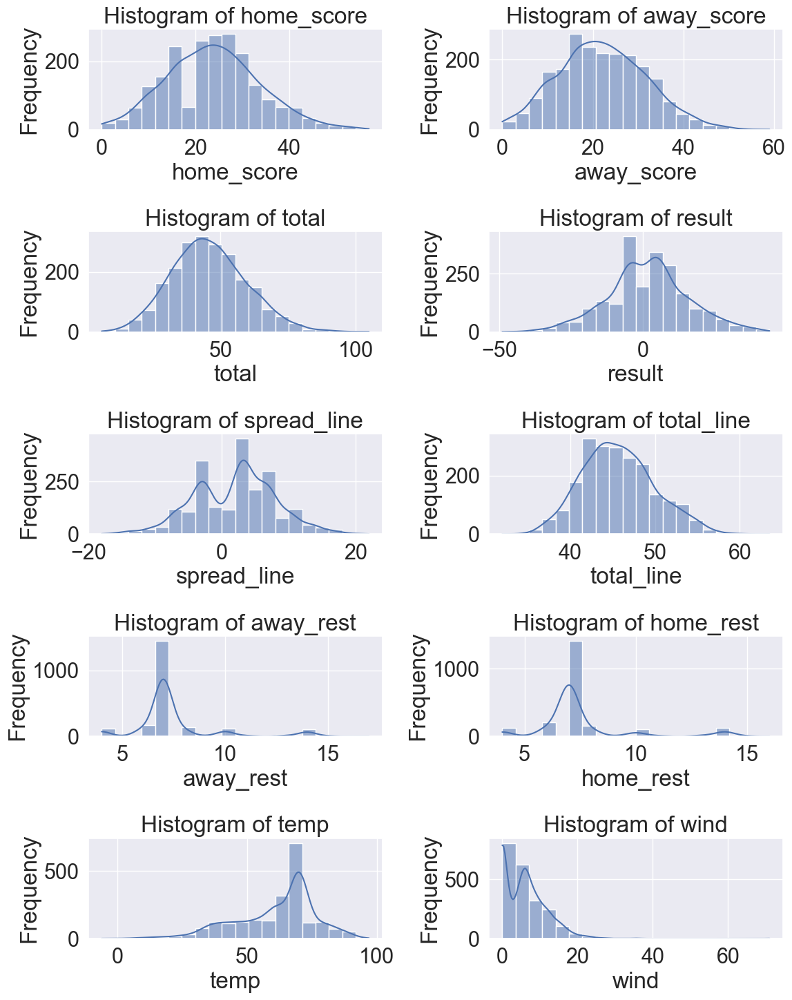

In [353]:
cols_to_plot = ['home_score', 'away_score', 'total',
                'result', 'spread_line', 'total_line',
                'away_rest',  'home_rest', 'temp', 'wind']

# Create a figure and axes for subplots
fig, axes = plt.subplots(5, 2, figsize=(12, 15))

# Loop through each numerical column and create histograms
for ax, column in zip(axes.flat, cols_to_plot):
    sns.histplot(data=schedule, x=column, bins=20, kde=True, ax=ax)
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.set_title(f'Histogram of {column}')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

/tmp/ipykernel_18420/3644938447.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
/tmp/ipykernel_18420/3644938447.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
/tmp/ipykernel_18420/3644938447.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
/tmp/ipykernel_18420/3644938447.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
/tmp/ipykernel_18420/3644938447.py:15: UserWarning: set_ticklabels() should only be used with a fixed number

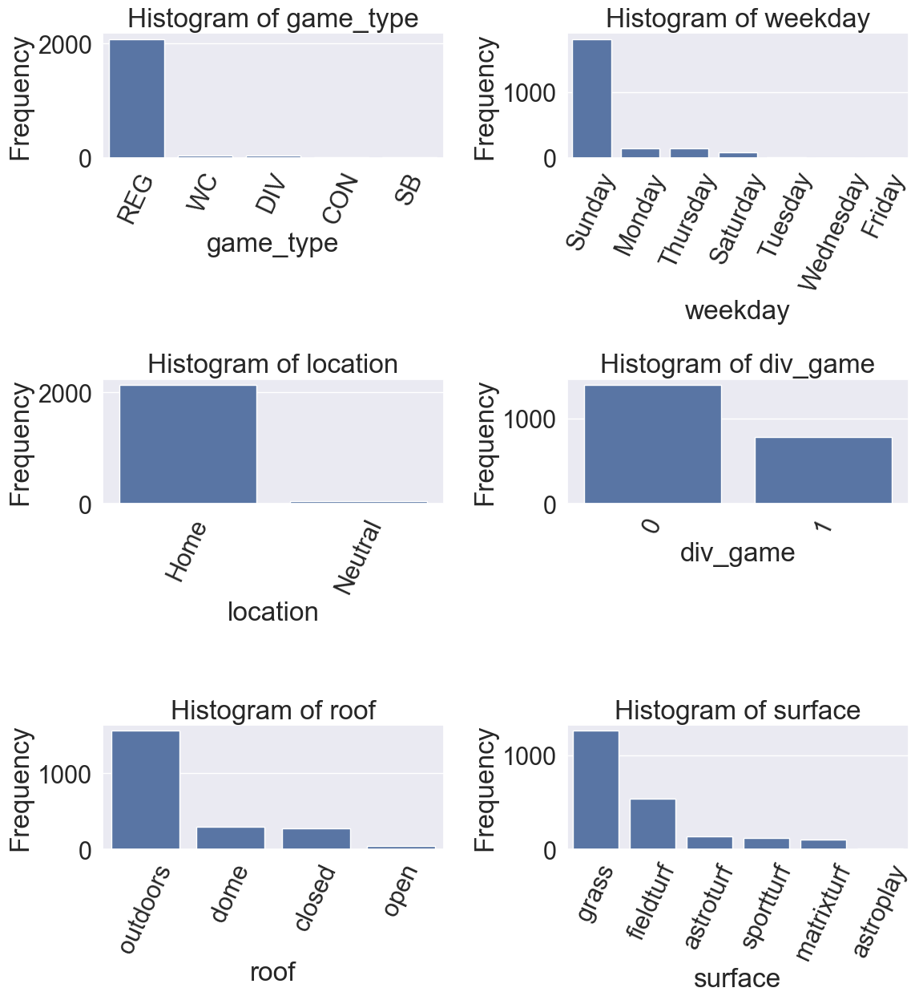

In [354]:
bar_plot_cols = ['game_type', 'weekday', 'location', 'div_game', 'roof', 'surface']

# Create a figure and axes for subplots
fig, axes = plt.subplots(3, 2, figsize=(12, 13))

# Loop through each numerical column and create histograms
for ax, column in zip(axes.flat, bar_plot_cols):
    value_counts = schedule[column].value_counts().sort_values(ascending=False)
    
    sns.countplot(data=schedule, x=column, order=value_counts.index, ax=ax)
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.set_title(f'Histogram of {column}')
    # Rotate x-axis tick labels by 45 degrees
    ax.set_xticklabels(ax.get_xticklabels(), rotation=65)

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

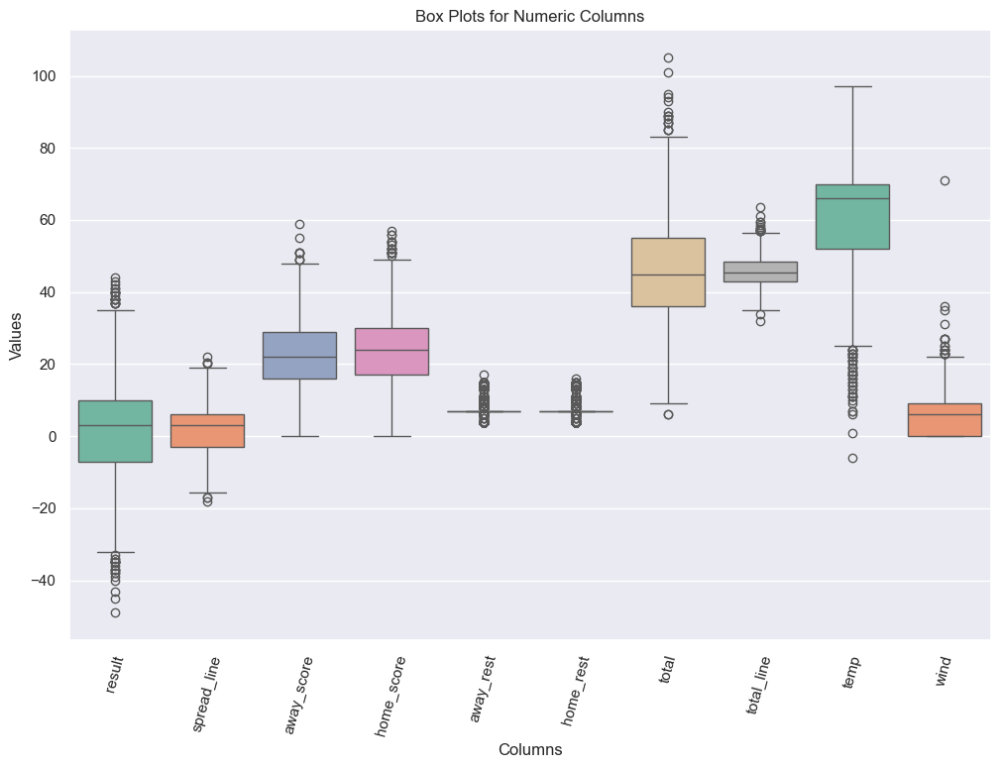

In [355]:
numeric_columns = ['result', 'spread_line', 'away_score', 'home_score', 'away_rest', 'home_rest',  'total',  'total_line', 'temp', 'wind']

# Create a subset of the DataFrame with numeric columns
numeric_df = schedule[numeric_columns]

# Create box plots for each numeric column
plt.figure(figsize=(12, 8))
sns.set_theme(style="darkgrid")  # Customize the style if needed
sns.boxplot(data=numeric_df, orient="v", palette="Set2")
plt.xticks(rotation=75)  # Rotate x-axis labels for readability
plt.title("Box Plots for Numeric Columns")
plt.xlabel("Columns")
plt.ylabel("Values")
plt.show()

In [356]:
schedule.columns

Index(['game_id', 'season', 'game_type', 'week', 'gameday', 'weekday',
       'gametime', 'away_team', 'away_score', 'home_team', 'home_score',
       'location', 'result', 'total', 'overtime', 'away_rest', 'home_rest',
       'away_moneyline', 'home_moneyline', 'spread_line', 'away_spread_odds',
       'home_spread_odds', 'total_line', 'under_odds', 'over_odds', 'div_game',
       'roof', 'surface', 'temp', 'wind', 'away_qb_id', 'home_qb_id',
       'away_qb_name', 'home_qb_name', 'away_coach', 'home_coach', 'referee',
       'stadium_id', 'stadium'],
      dtype='object')

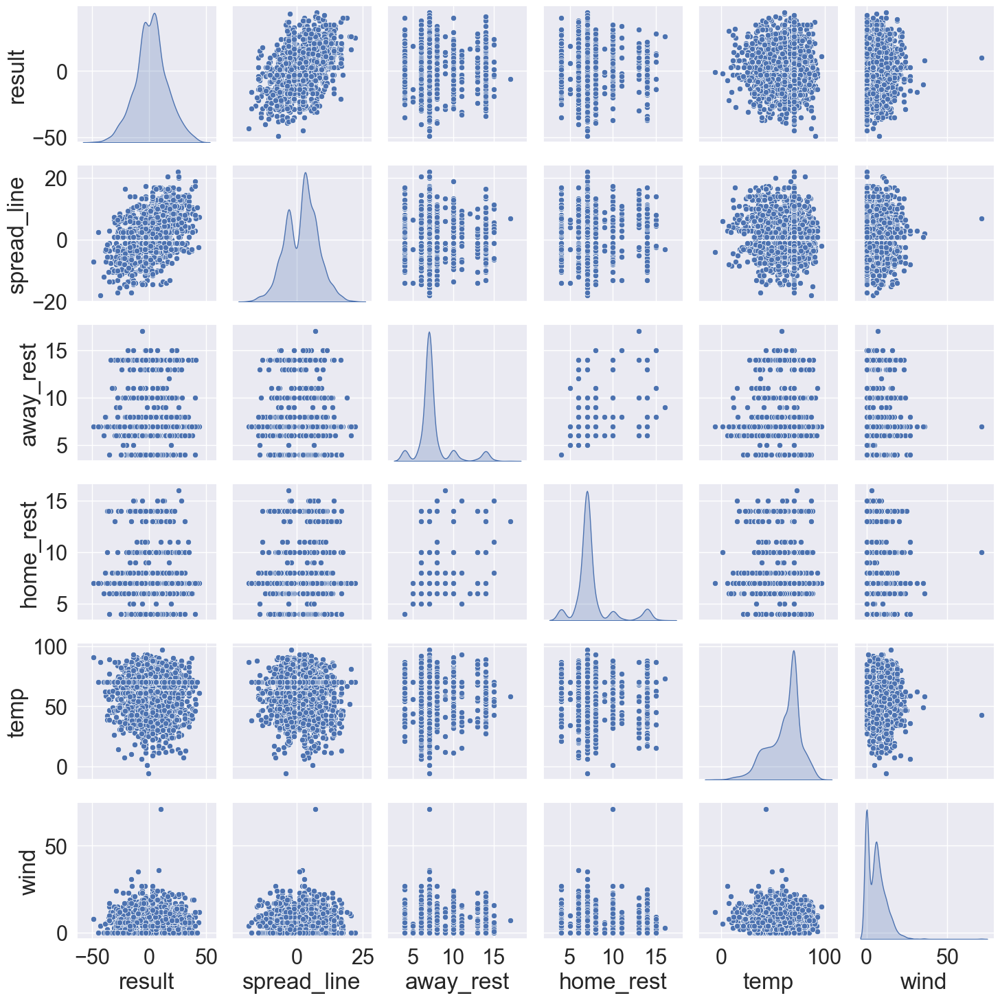

In [357]:
numeric_columns = ['result', 'spread_line', 'away_rest', 'home_rest', 'temp', 'wind']


# Create pair-wise scatterplots for selected columns
sns.set_theme(style="darkgrid", font_scale = 2)
pair_plot = sns.pairplot(schedule[numeric_columns], diag_kind="kde")  # 'kde' for density plots on diagonal

plt.show()

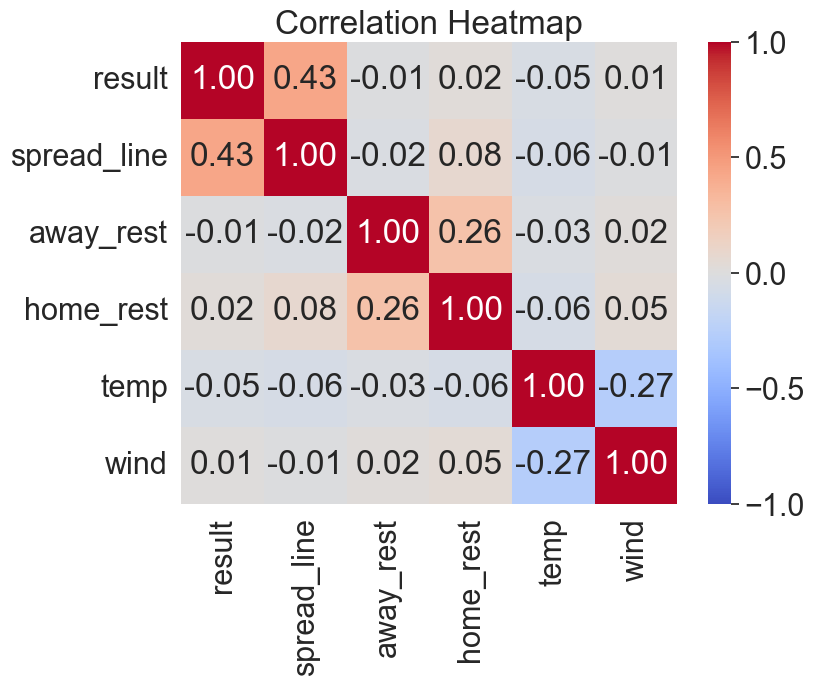

In [358]:
df_selected = schedule[numeric_columns]

# Compute the correlation matrix
correlation_matrix = df_selected.corr()

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

### ANOVA 

In [359]:
categorical_columns = ['weekday', 'location', 'roof', 'surface', 'home_team',
                       'away_team', 'weekday', 'stadium', 'away_qb_name', 'home_qb_name',
                       'away_coach', 'home_coach', 'referee']

In [360]:
# Create an empty DataFrame to store ANOVA results
anova_results = []

# Loop through each categorical column and perform one-way ANOVA
for col in categorical_columns:
    formula = f"result ~ {col}"

    model = ols(formula, data=schedule).fit()
    anova_table = sm.stats.anova_lm(model, typ=2).reset_index(drop=True)
 
    # Extract F-value and p-value
    f_value = anova_table.loc[0, 'F']
    p_value = anova_table.loc[0, 'PR(>F)']
    
    # Create a DataFrame for the current ANOVA result
    result_df = pd.DataFrame({'Categorical_Variable': [col], 'F-Value': [f_value], 'P-Value': [p_value]})
    
    # Append the result DataFrame to the list
    anova_results.append(result_df)

# Concatenate all ANOVA result DataFrames into a final DataFrame
final_anova_results = pd.concat(anova_results, ignore_index=True)

# Display the ANOVA results
print("Full Results: ")
print(final_anova_results)
print("\nStatistically significant columns: ")
print(final_anova_results.loc[final_anova_results['P-Value'] <= .05])

Full Results: 
   Categorical_Variable   F-Value       P-Value
0               weekday  1.168457  3.203036e-01
1              location  0.643891  4.223931e-01
2                  roof  0.851435  4.657194e-01
3               surface  0.796993  5.517131e-01
4             home_team  3.702629  4.812621e-12
5             away_team  4.445483  5.035900e-16
6               weekday  1.168457  3.203036e-01
7               stadium  2.892322  5.263898e-11
8          away_qb_name  2.458481  3.388869e-17
9          home_qb_name  2.662027  7.090378e-20
10           away_coach  3.163581  9.307060e-19
11           home_coach  2.673182  1.634919e-13
12              referee  1.088284  3.395609e-01

Statistically significant columns: 
   Categorical_Variable   F-Value       P-Value
4             home_team  3.702629  4.812621e-12
5             away_team  4.445483  5.035900e-16
7               stadium  2.892322  5.263898e-11
8          away_qb_name  2.458481  3.388869e-17
9          home_qb_name  2.662027  7

## Time Series Analysis

In [361]:
#adding datetime column
schedule['datetime'] = schedule['gameday'] + " " + schedule['gametime']
schedule['datetime'] = pd.to_datetime(schedule['datetime'],  format='%Y-%m-%d %H:%M')

In [362]:
home_df = schedule[['datetime', 'home_team', 'result', 'spread_line', 'game_id']].copy()
away_df = schedule[['datetime', 'away_team', 'result', 'spread_line', 'game_id']].copy()

# Rename columns for each DataFrame
home_df.rename(columns={'home_team': 'team'}, inplace=True)
home_df['home_team_indicator'] = 1
away_df.rename(columns={'away_team': 'team'}, inplace=True)
away_df['result'] = -away_df['result']  # Invert the sign
away_df['spread_line'] = -away_df['spread_line']
away_df['home_team_indicator'] = 0

# Create a new DataFrame by concatenating home and away DataFrames
datetime_df = pd.concat([home_df, away_df], ignore_index=True)
datetime_df['result_vs_spread'] = datetime_df['result'] + datetime_df['spread_line']

### Result vs Spread column plots

<Axes: xlabel='result_vs_spread', ylabel='Count'>

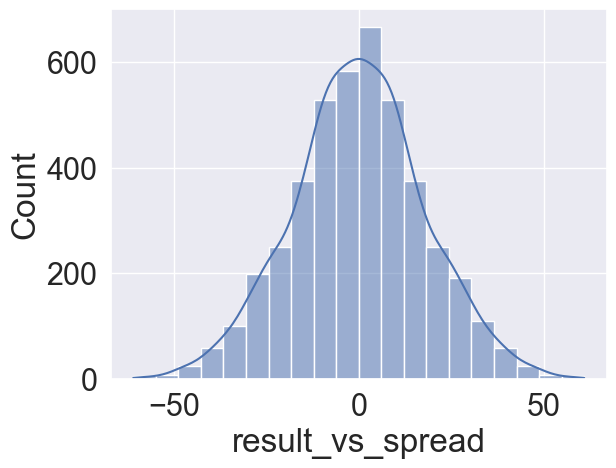

In [363]:
#Result vs Spread hist
sns.histplot(data=datetime_df, x='result_vs_spread', bins=20, kde=True)

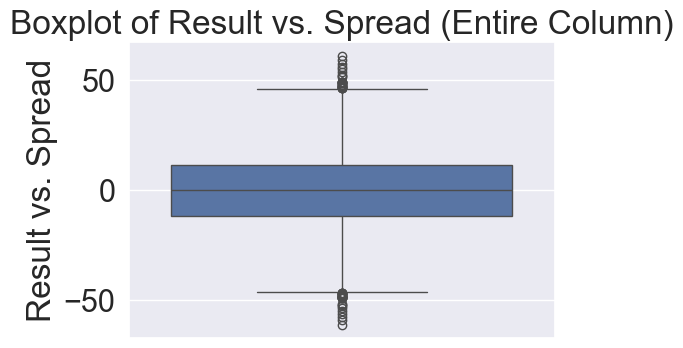

In [364]:
# Create a boxplot for the entire 'result_vs_spread' column
plt.figure(figsize=(6, 4))  # Set the figure size
sns.boxplot(y='result_vs_spread', data=datetime_df)

# Set labels and title
plt.ylabel('Result vs. Spread')
plt.title('Boxplot of Result vs. Spread (Entire Column)')

# Show the plot
plt.tight_layout()
plt.show()

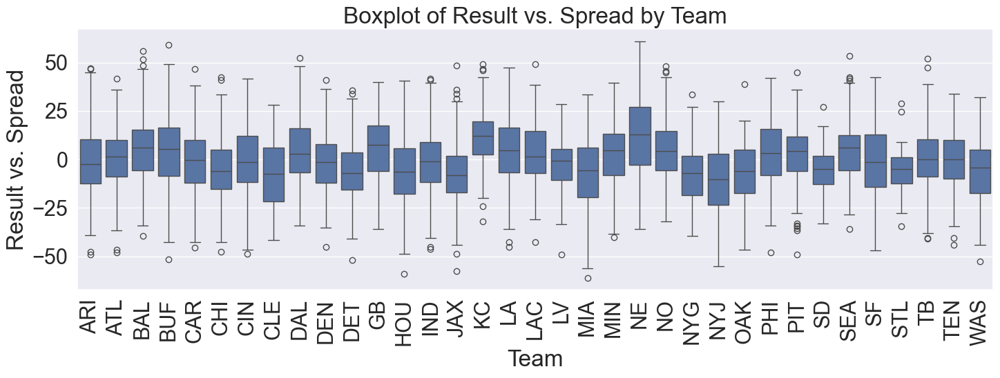

In [365]:
plt.figure(figsize=(15,6))
sns.boxplot(x='team', y='result_vs_spread', data=datetime_df, order=sorted(datetime_df['team'].unique()))
# Set labels and title
plt.xlabel('Team')
plt.ylabel('Result vs. Spread')
plt.title('Boxplot of Result vs. Spread by Team')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.tight_layout()
plt.show()

### Time Series Plots of Result and Result vs Spread

In [366]:
def plot_time_series(datetime_df, min_date, time_delta_days, col_to_plot):
    unique_teams = datetime_df['team'].unique()
    min_datetime = pd.to_datetime(min_date)
    max_datetime = min_datetime + timedelta(days=time_delta_days)
    # Loop through each team and create a time-series plot
    for team_name in unique_teams:
        # Create a subset of the data for the specific team
        team_data = datetime_df[(datetime_df['team'] == team_name) 
                                & (datetime_df['datetime'] > min_datetime)
                               & (datetime_df['datetime'] < max_datetime)]
     
        # Sort the data by datetime in ascending order
        team_data.sort_values(by='datetime', inplace=True)
        team_data.reset_index(drop=True, inplace=True)
        
        # Create the time-series plot
        plt.figure(figsize=(10, 4))
        plt.plot(team_data['datetime'], team_data[col_to_plot], label=f'{team_name} Results')
        plt.xlabel('Date')
        plt.ylabel(col_to_plot)
        plt.title(f'{team_name} Performance Over Time')
        plt.grid(True)
#         plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()

        # Show the plot
        plt.show()

/tmp/ipykernel_18420/3571774192.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


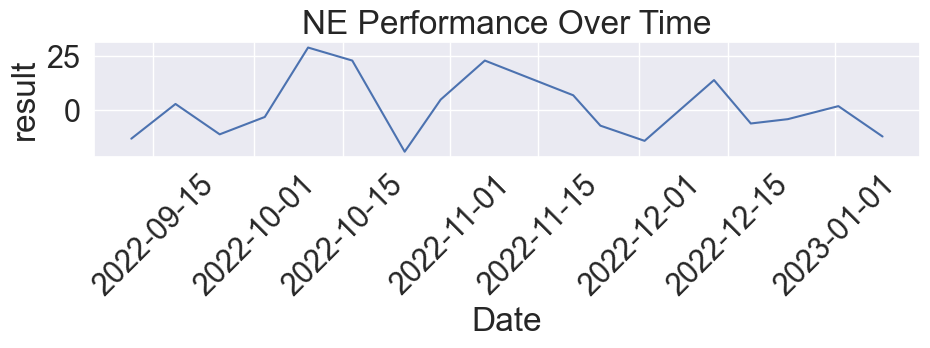

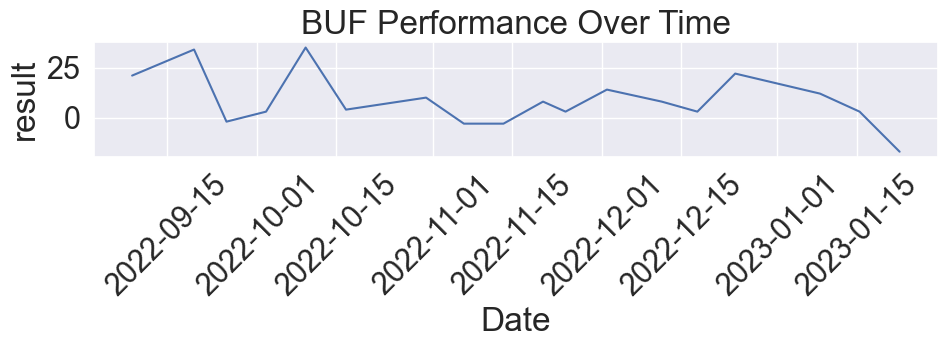

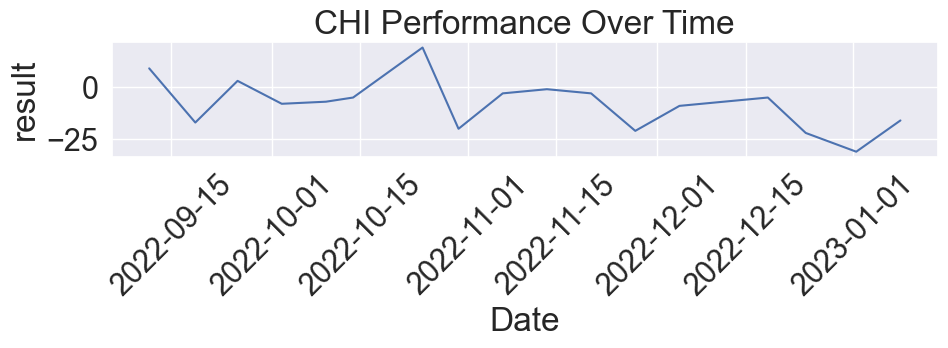

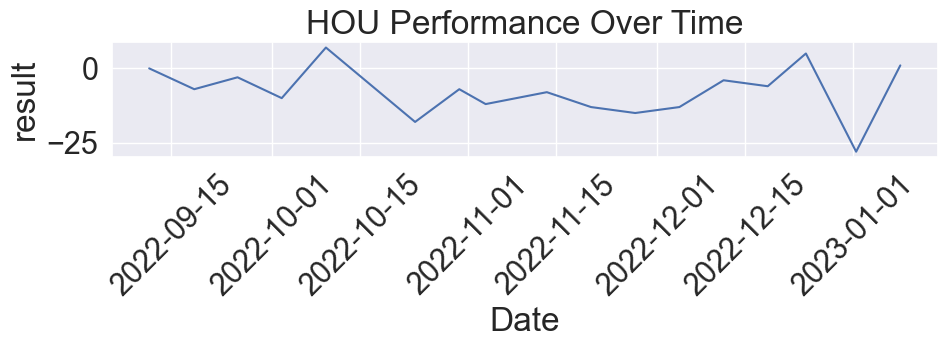

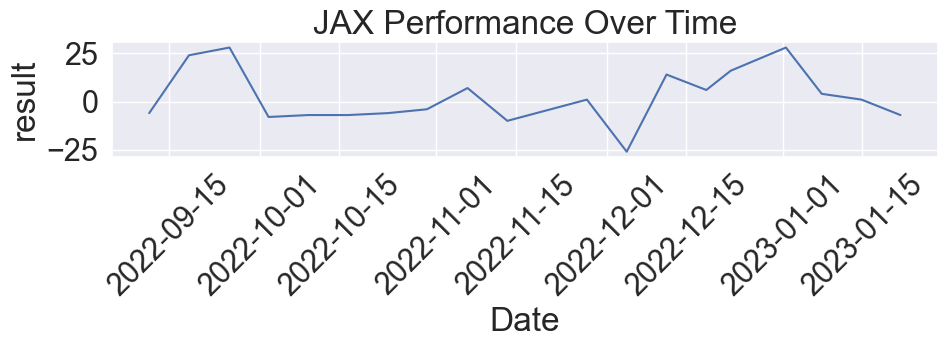

...

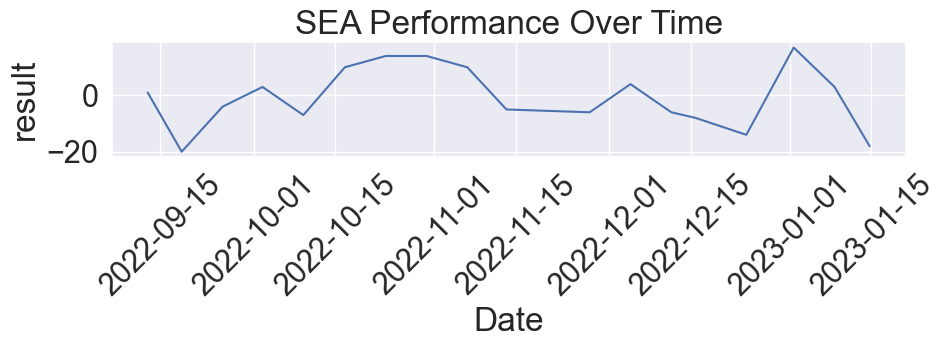

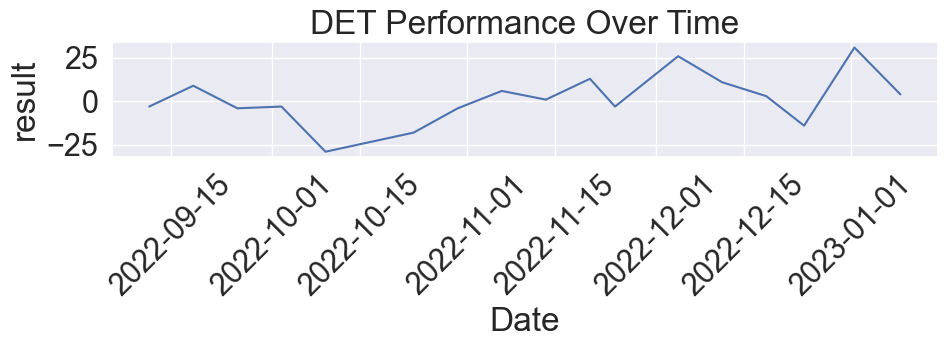

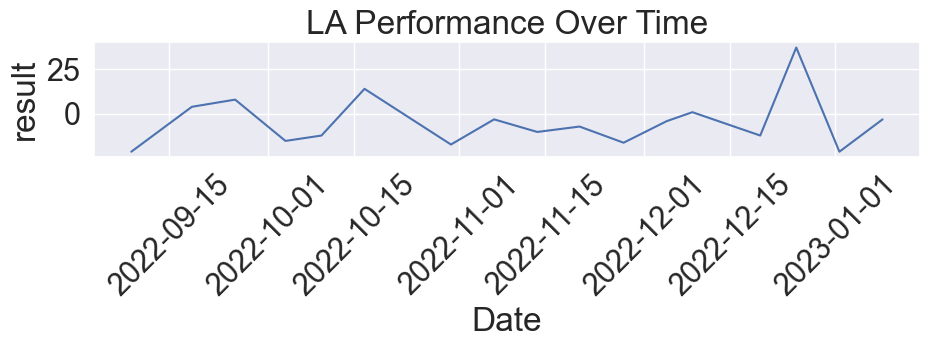

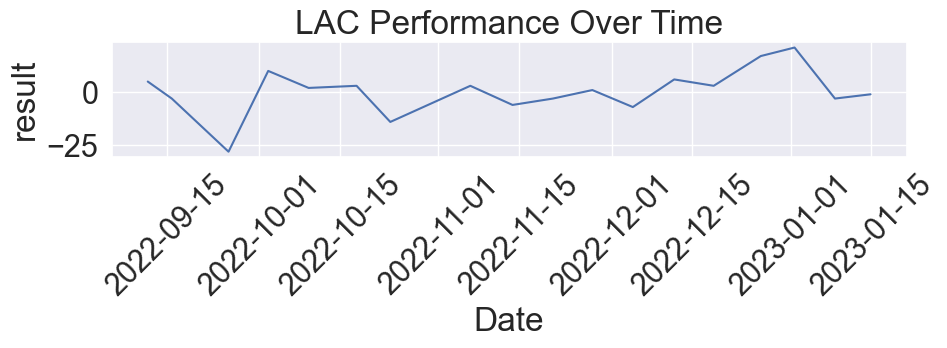

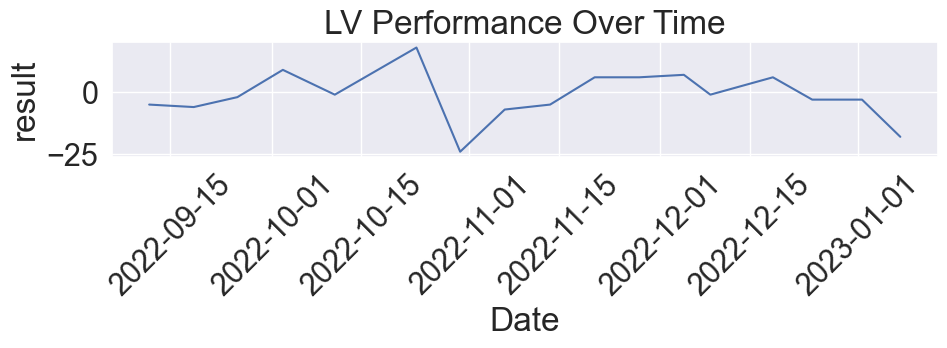

In [367]:
plot_time_series(datetime_df, '2022-08-01', 180, 'result')

/tmp/ipykernel_18420/3571774192.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


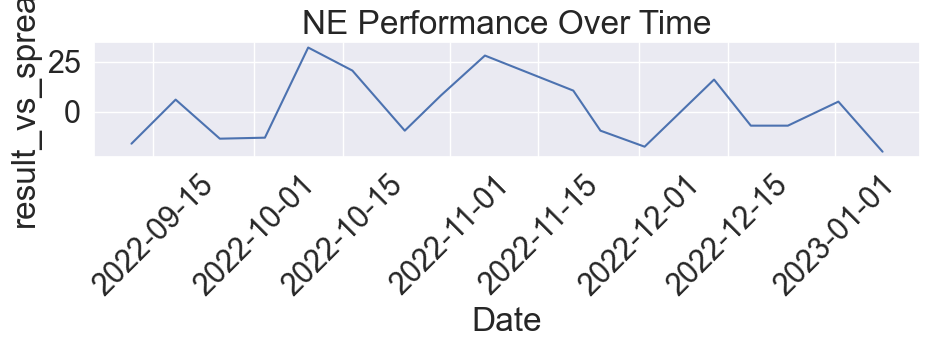

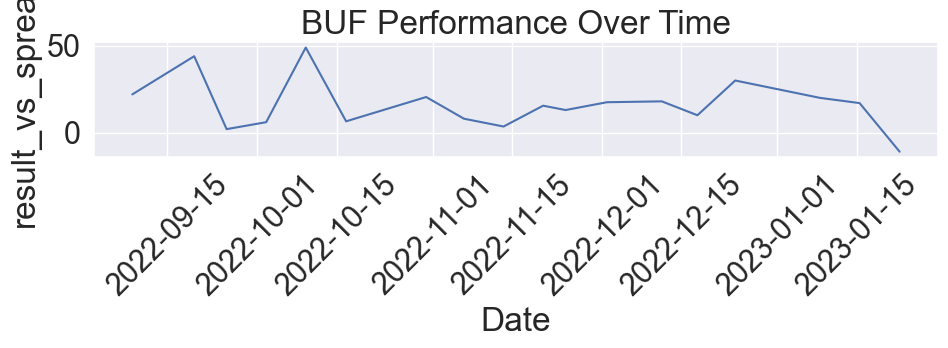

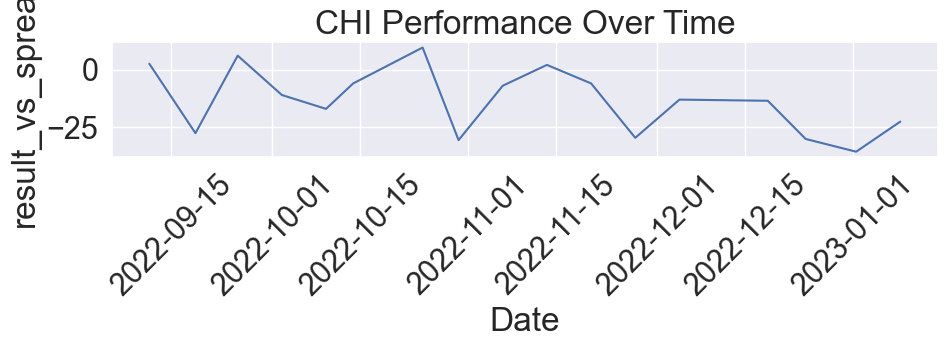

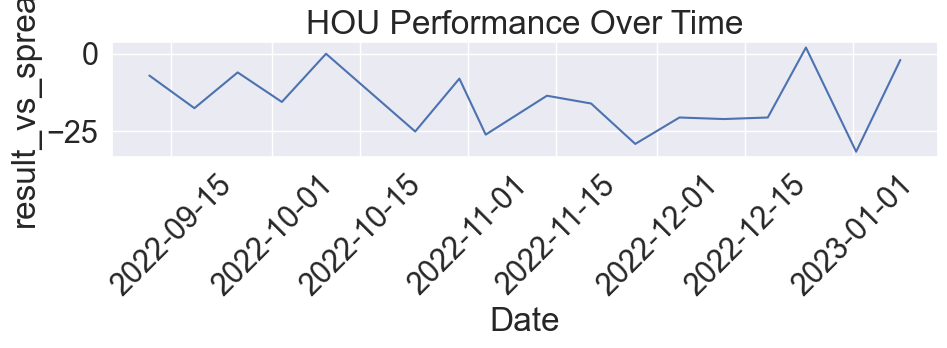

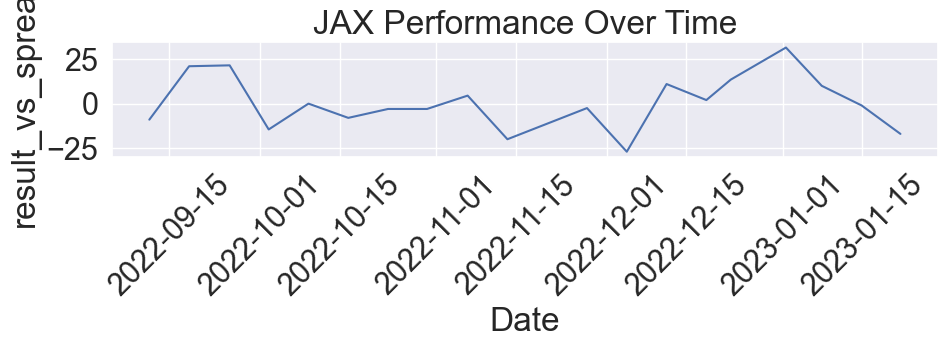

...

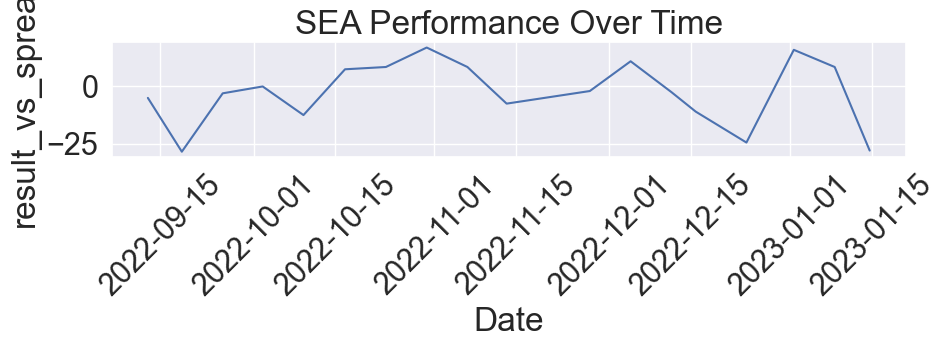

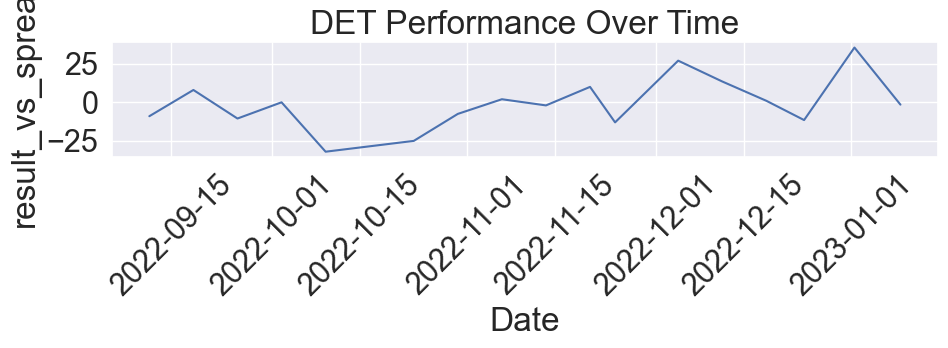

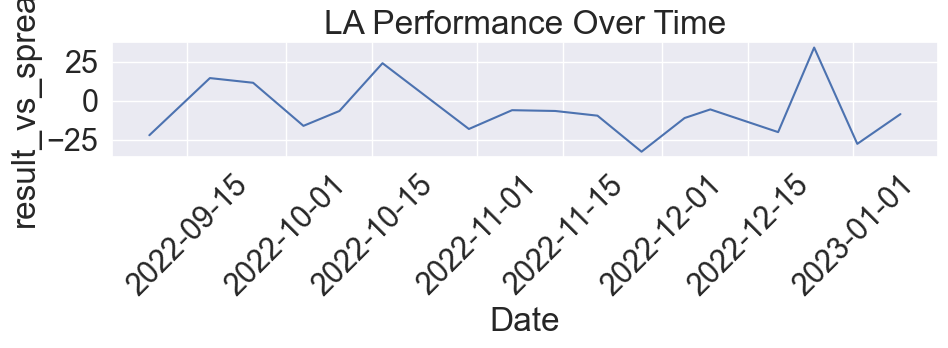

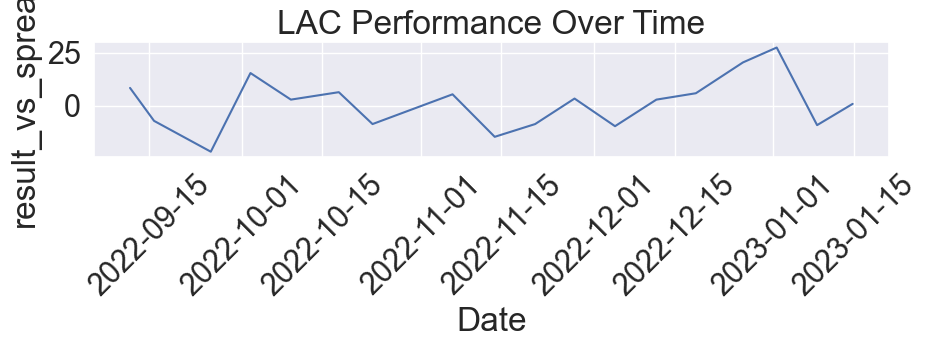

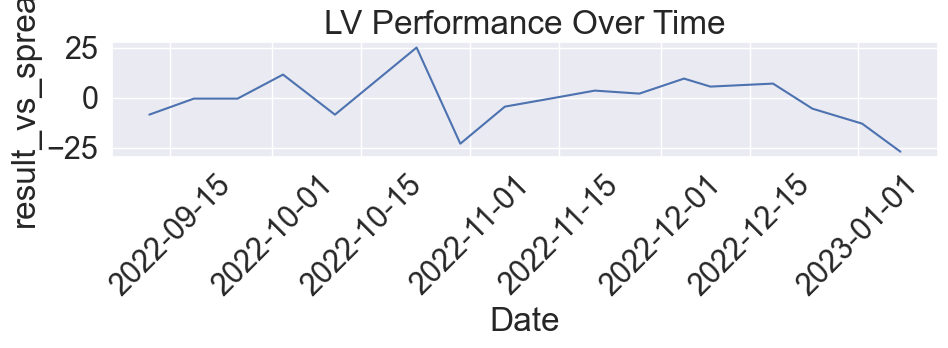

In [368]:
plot_time_series(datetime_df, '2022-08-01', 180, 'result_vs_spread')

In [369]:
def plot_auto_pauto(datetime_df, col_to_plot):
    unique_teams = datetime_df['team'].unique()
    for team_name in unique_teams:
        try:
            # Filter data for the current team
            team_data = datetime_df[datetime_df['team'] == team_name]

            # Sort the data by datetime if it's not already sorted
            team_data.sort_values(by='datetime', inplace=True)
            team_data.reset_index(drop=True, inplace=True)

            # Calculate ACF and PACF for the result column
            result_series = team_data[col_to_plot]

            # Plot ACF for the current team
            plt.figure(figsize=(8, 4))
            plot_acf(result_series, lags=16, title=f'ACF for {team_name}')
            plt.xlabel('Lags')
            plt.ylabel('{col_to_plot} Autocorrelation')
            plt.show()

            # Plot PACF for the current team
            plt.figure(figsize=(9, 4))
            plot_pacf(result_series, lags=16, title=f'PACF for {team_name}')
            plt.xlabel('Lags')
            plt.ylabel('Result Partial Autocorrelation')
            plt.show()
        except Exception as e:
            # Handle the exception here
            print(f"An error occurred while plotting: {e}")

### Autocorrelation and Partial Autocorrelation of Result and Result vs Spread

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

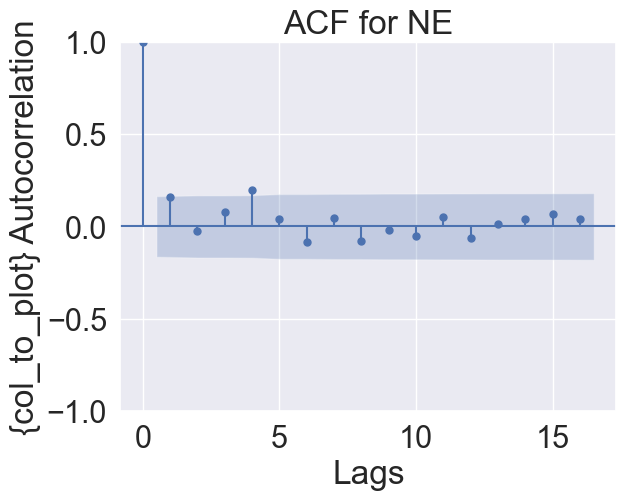

<Figure size 900x400 with 0 Axes>

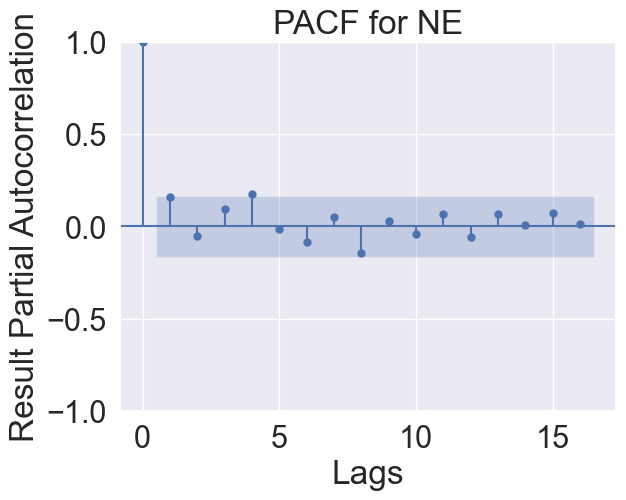

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

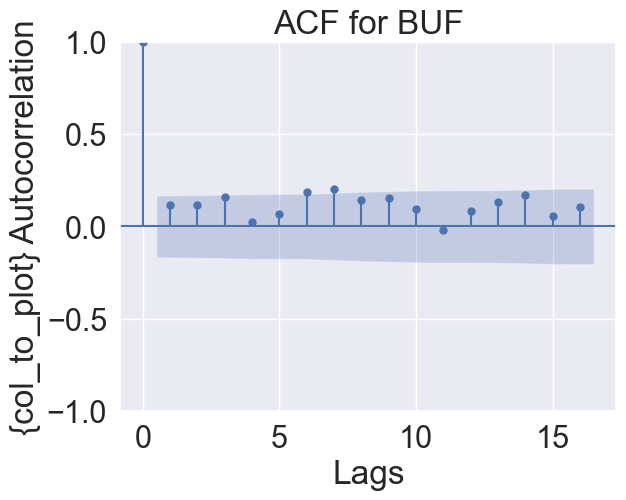

<Figure size 900x400 with 0 Axes>

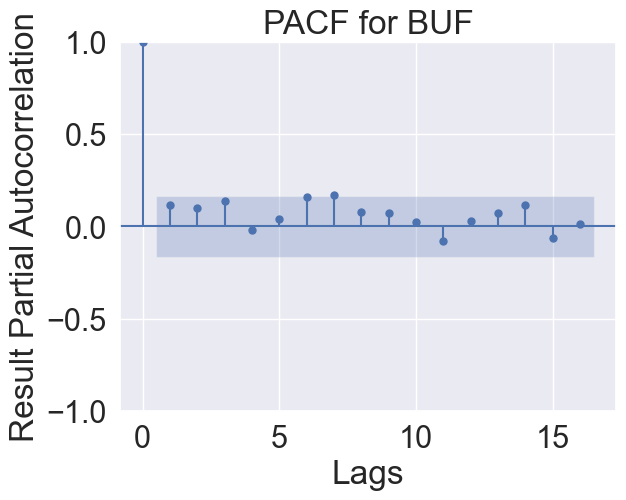

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

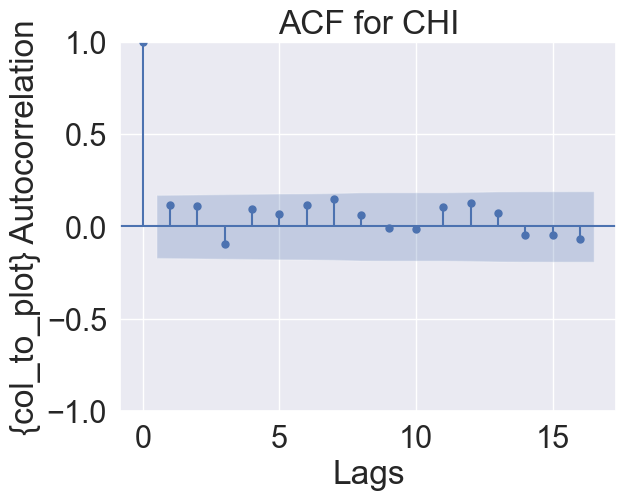

<Figure size 900x400 with 0 Axes>

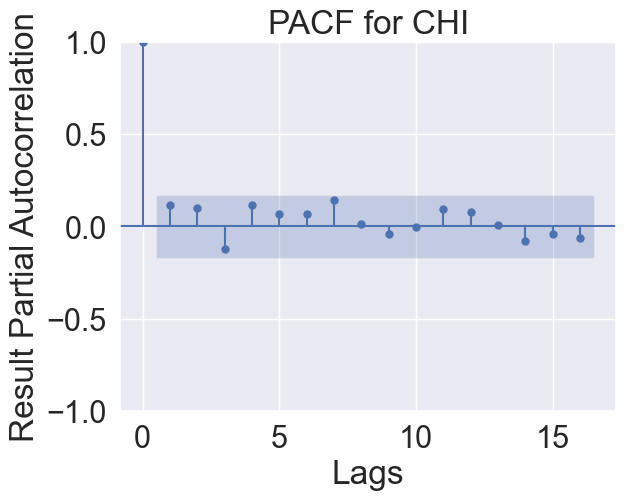

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

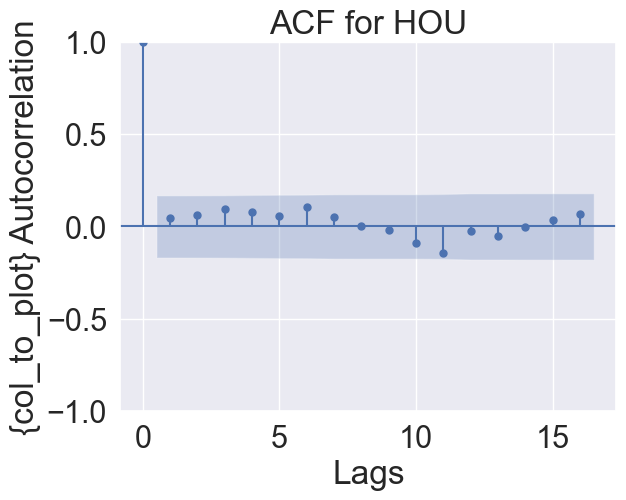

<Figure size 900x400 with 0 Axes>

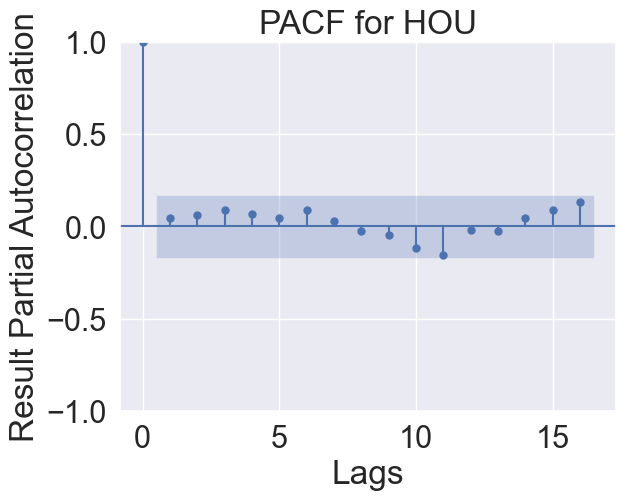

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

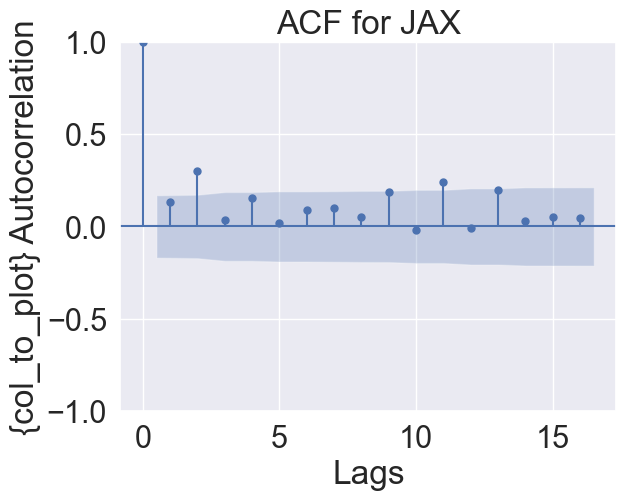

<Figure size 900x400 with 0 Axes>

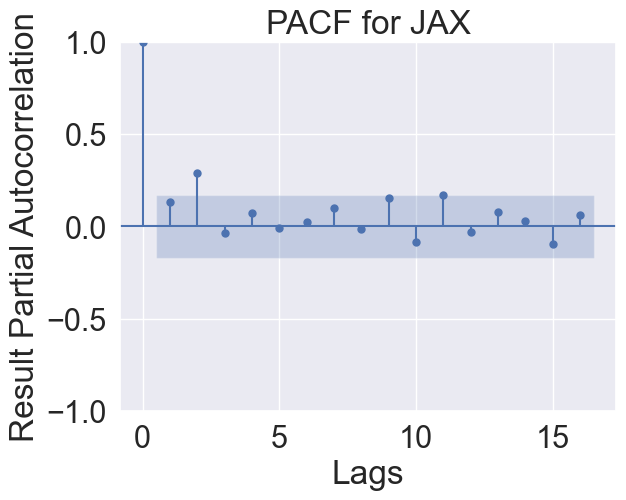

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

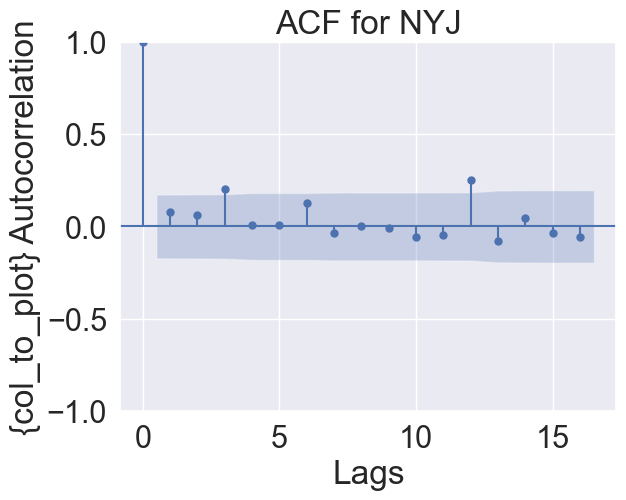

<Figure size 900x400 with 0 Axes>

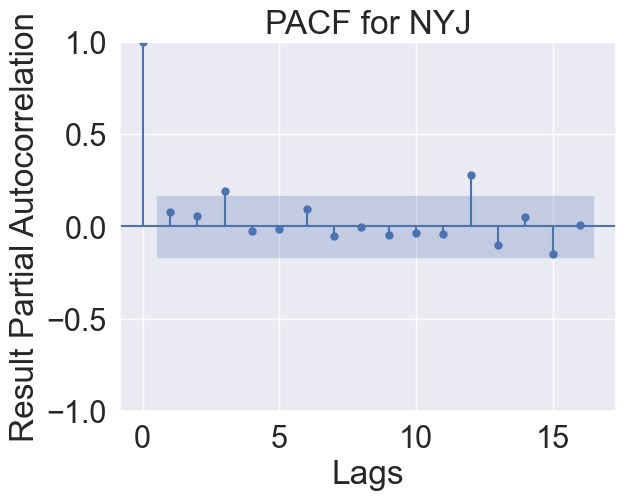

An error occurred while plotting: could not broadcast input array from shape (16,) into shape (17,)


/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

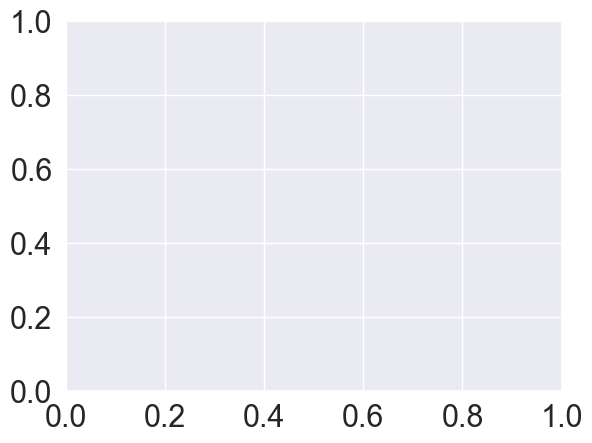

<Figure size 800x400 with 0 Axes>

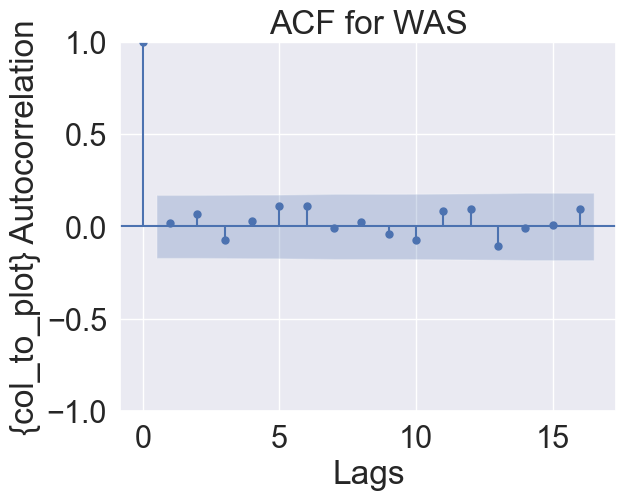

<Figure size 900x400 with 0 Axes>

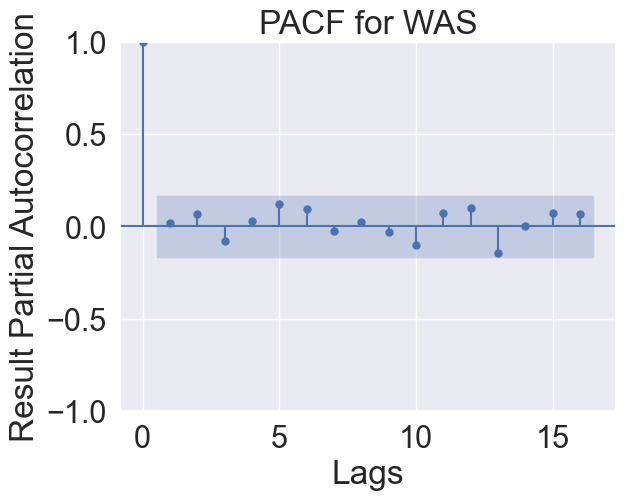

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

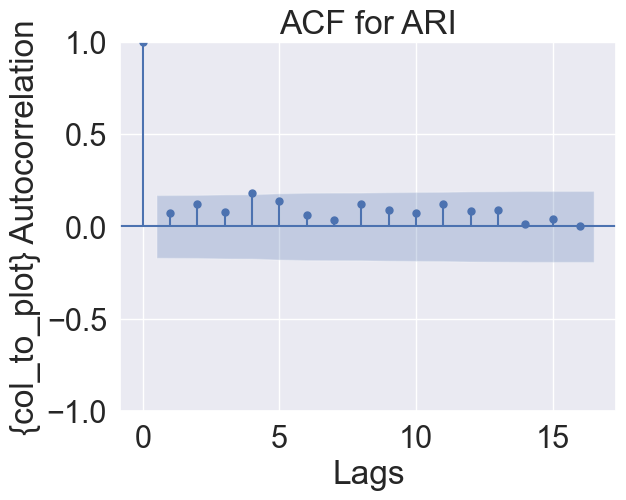

<Figure size 900x400 with 0 Axes>

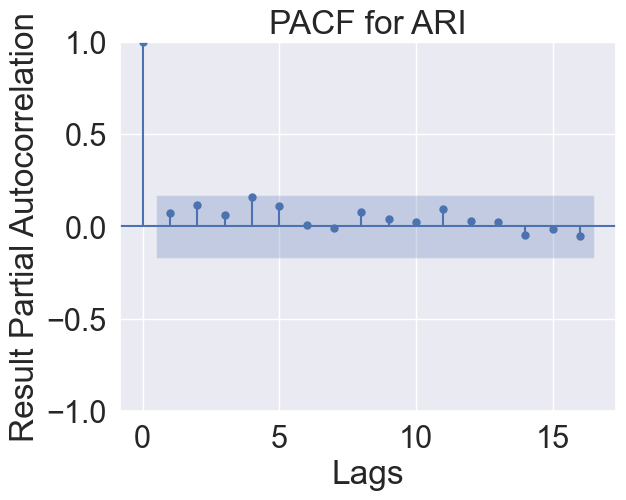

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

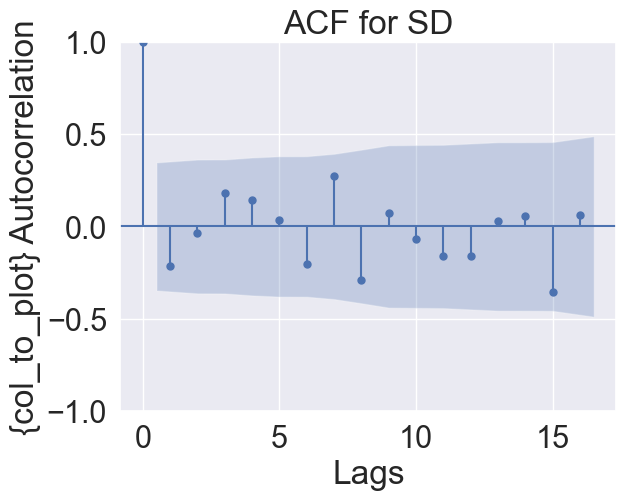

<Figure size 900x400 with 0 Axes>

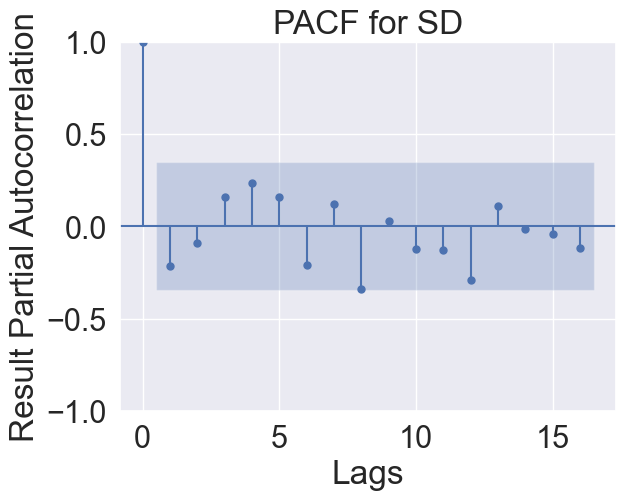

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

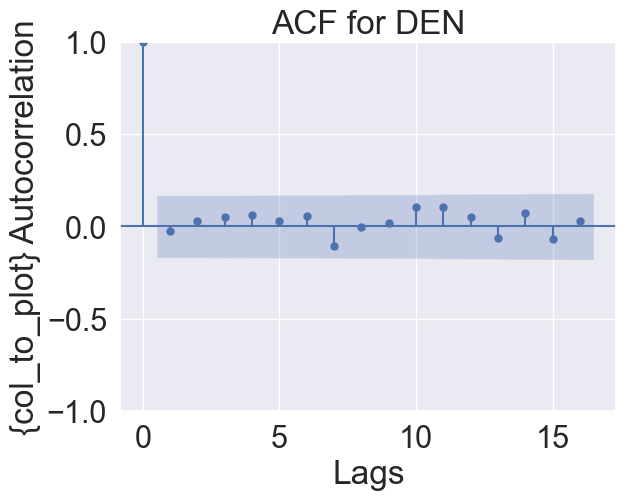

<Figure size 900x400 with 0 Axes>

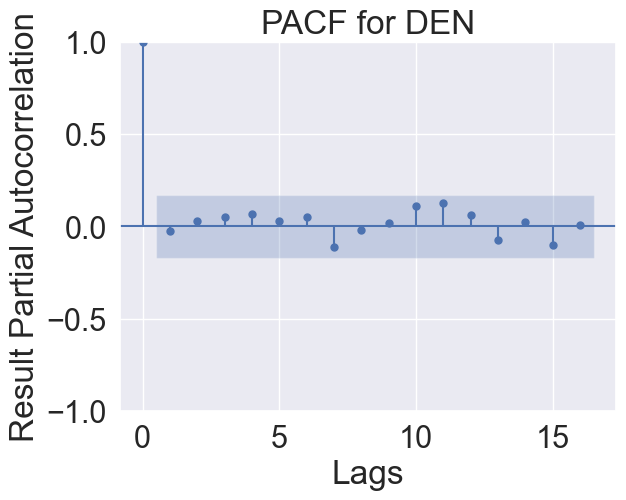

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

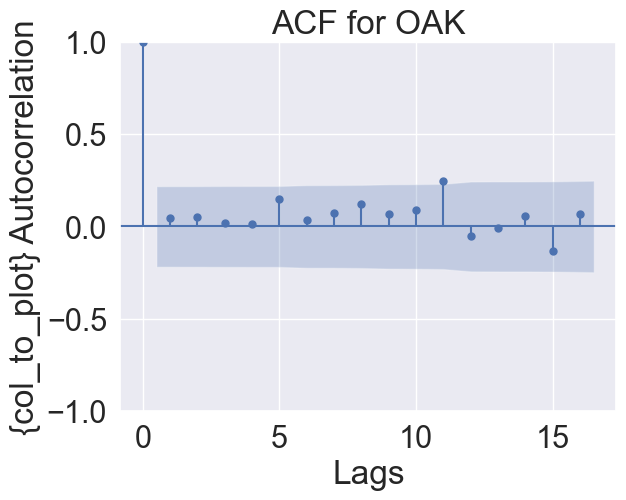

<Figure size 900x400 with 0 Axes>

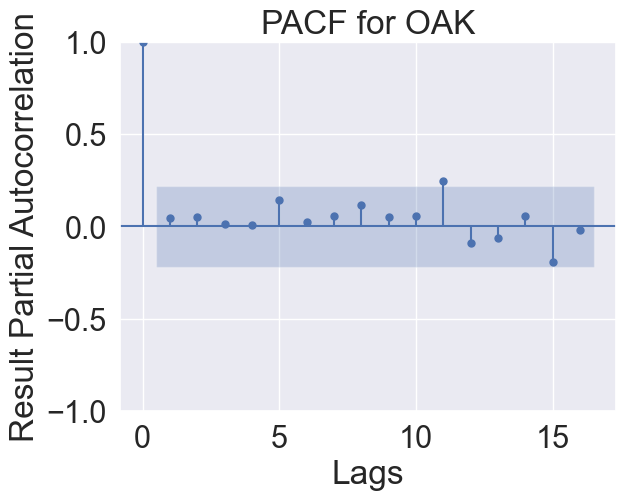

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

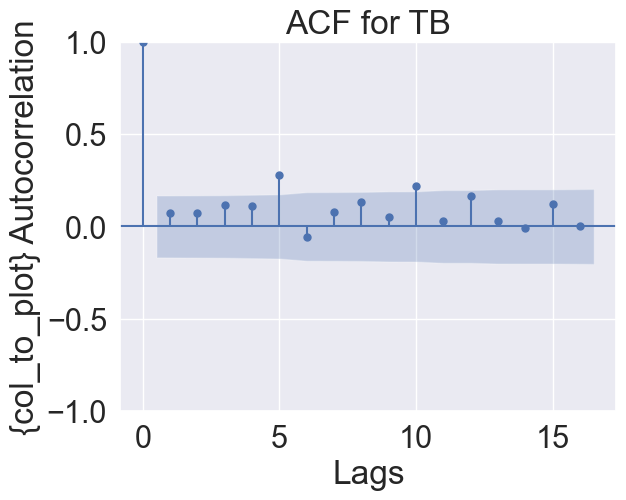

<Figure size 900x400 with 0 Axes>

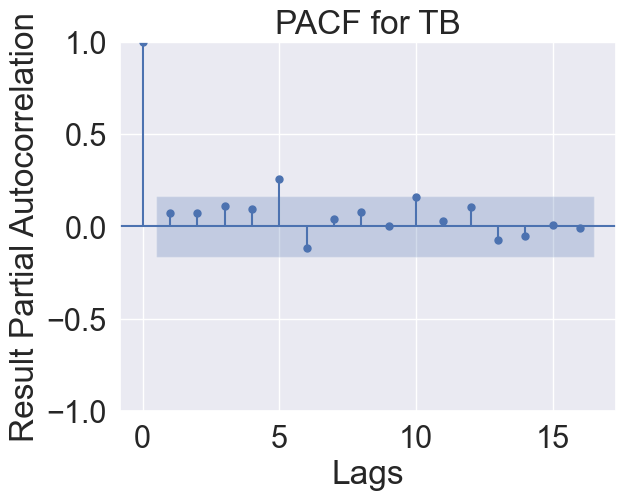

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

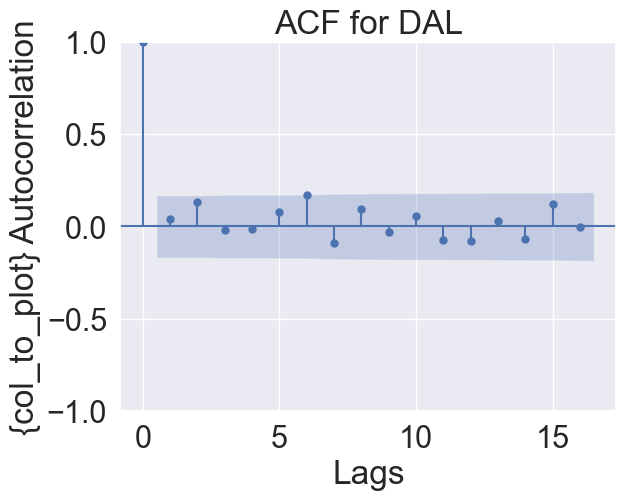

<Figure size 900x400 with 0 Axes>

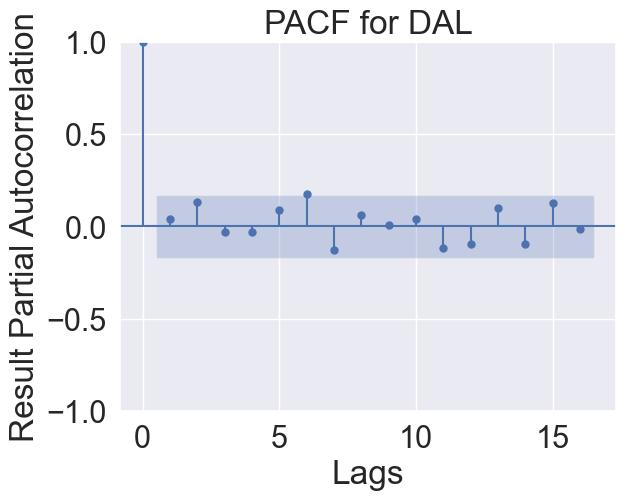

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

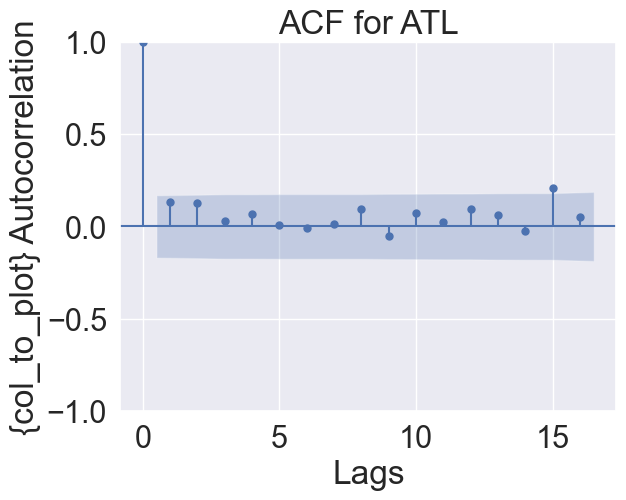

<Figure size 900x400 with 0 Axes>

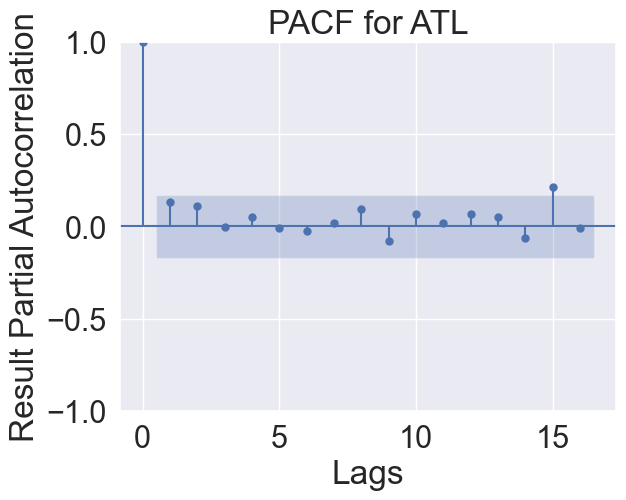

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

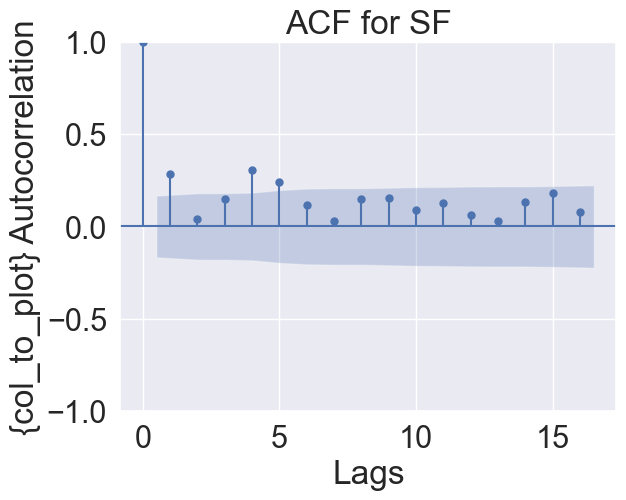

<Figure size 900x400 with 0 Axes>

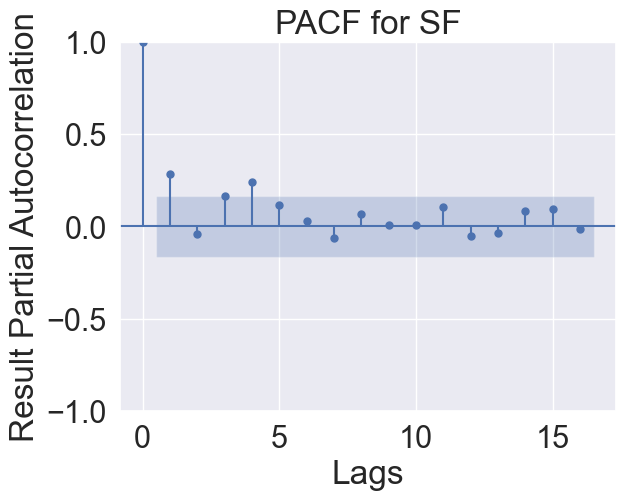

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

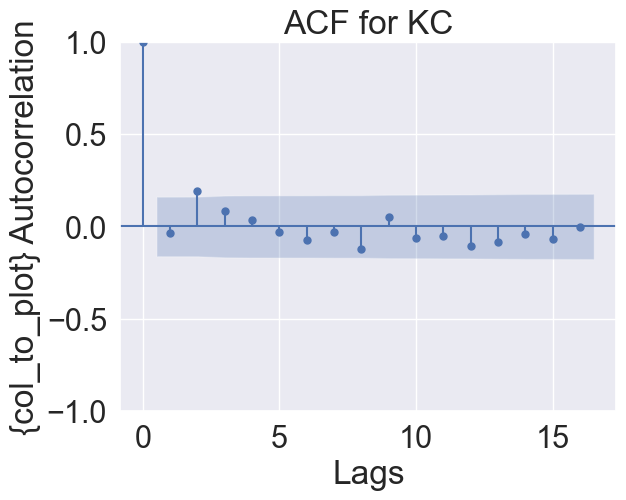

<Figure size 900x400 with 0 Axes>

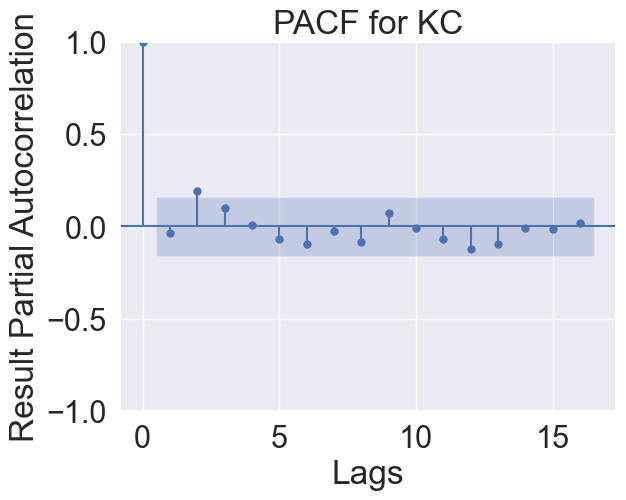

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

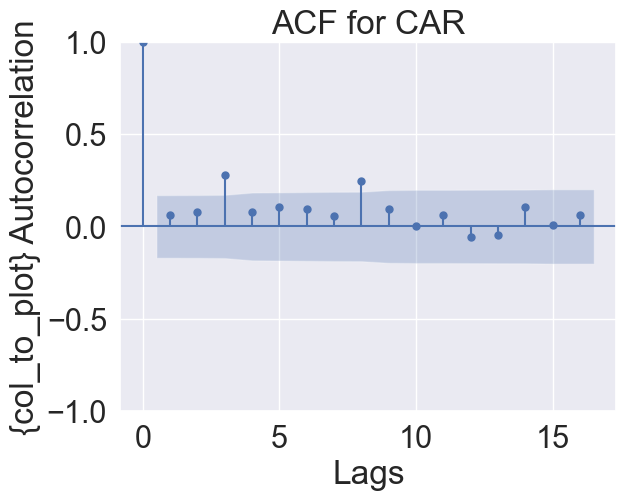

<Figure size 900x400 with 0 Axes>

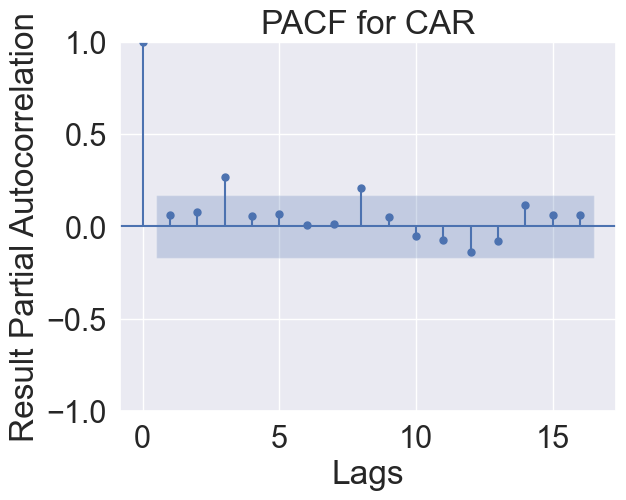

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

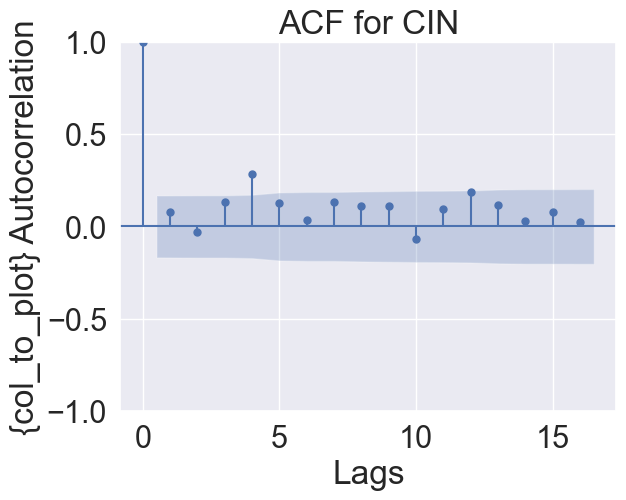

<Figure size 900x400 with 0 Axes>

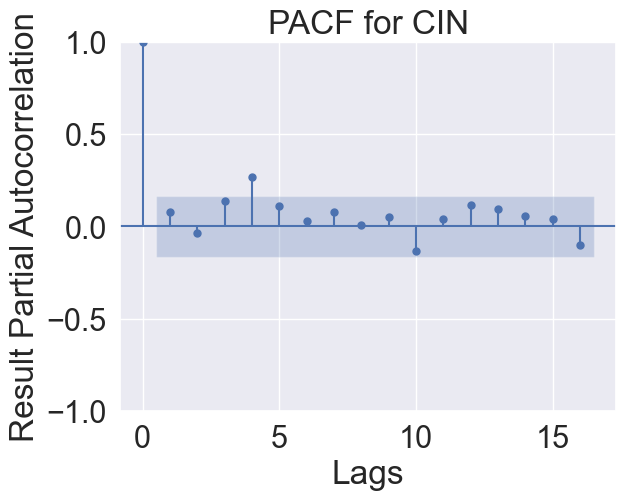

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

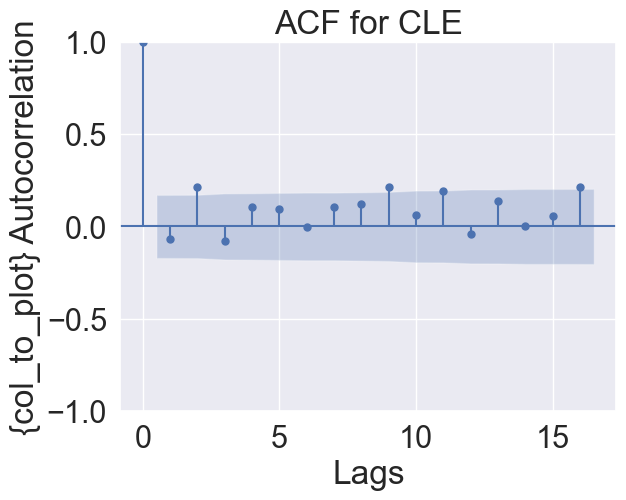

<Figure size 900x400 with 0 Axes>

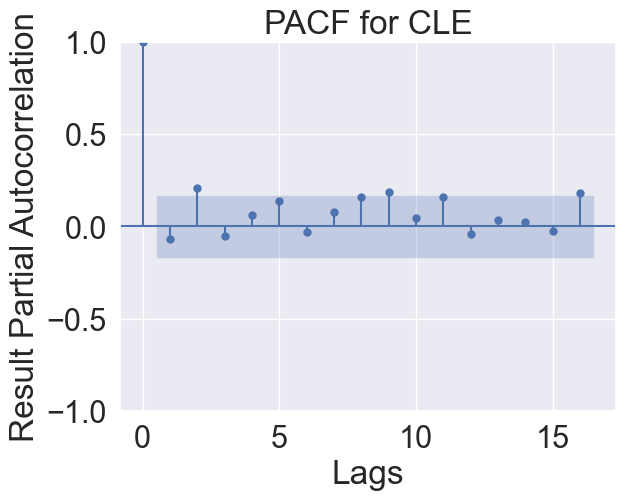

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

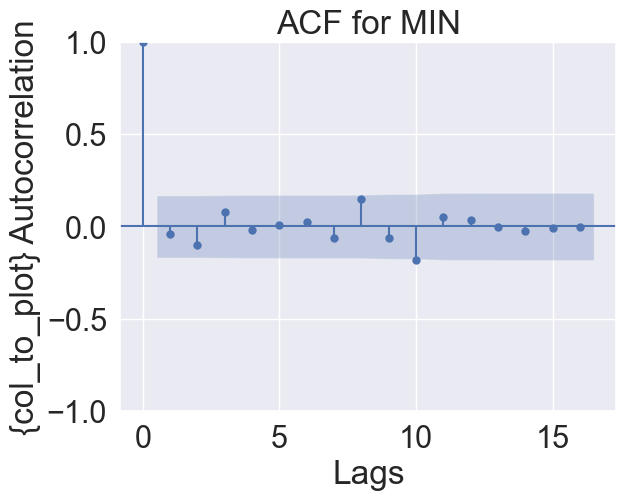

<Figure size 900x400 with 0 Axes>

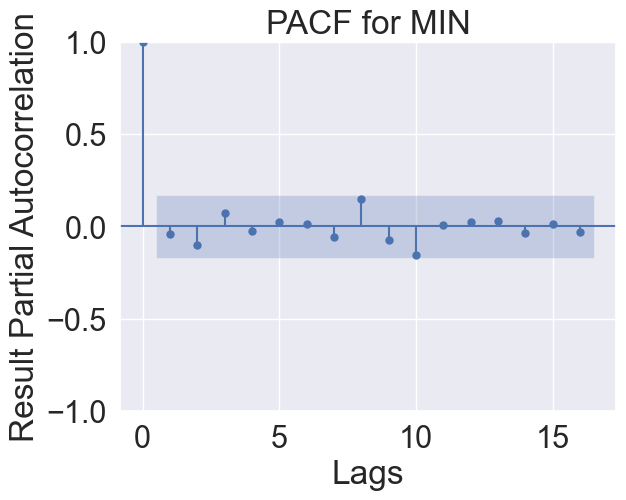

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

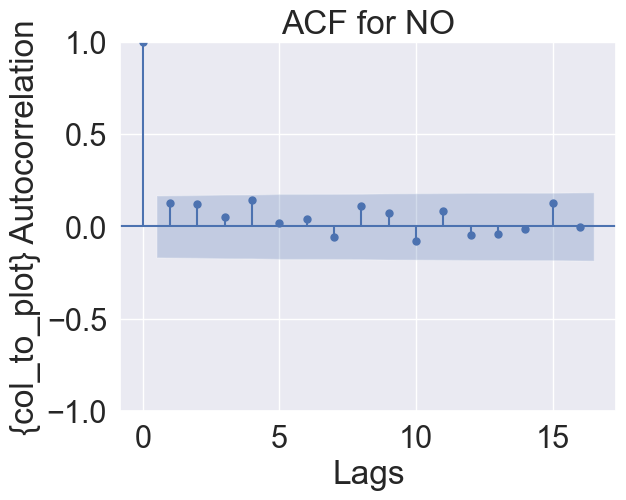

<Figure size 900x400 with 0 Axes>

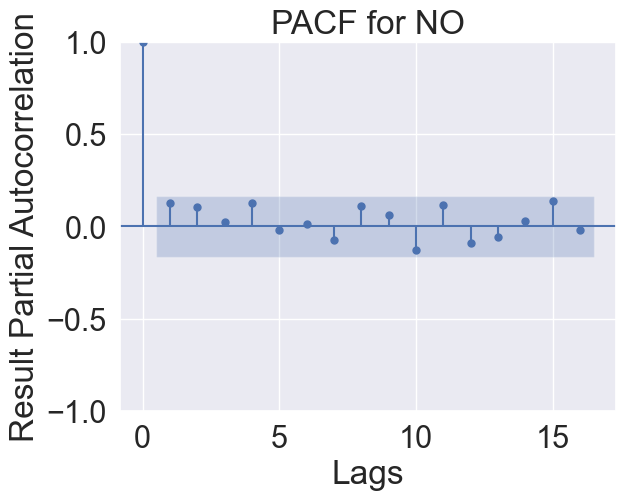

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

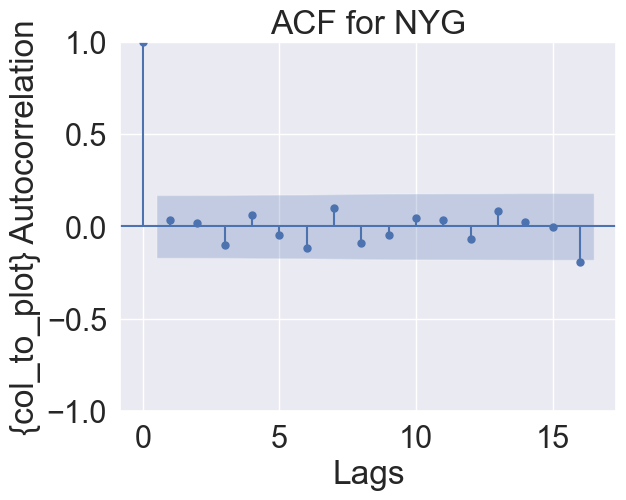

<Figure size 900x400 with 0 Axes>

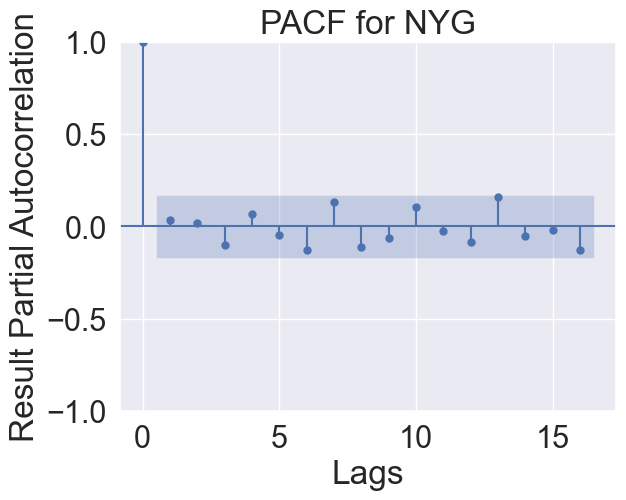

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

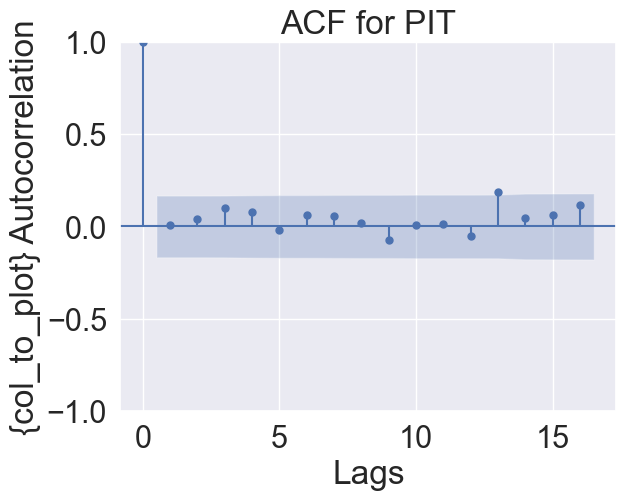

<Figure size 900x400 with 0 Axes>

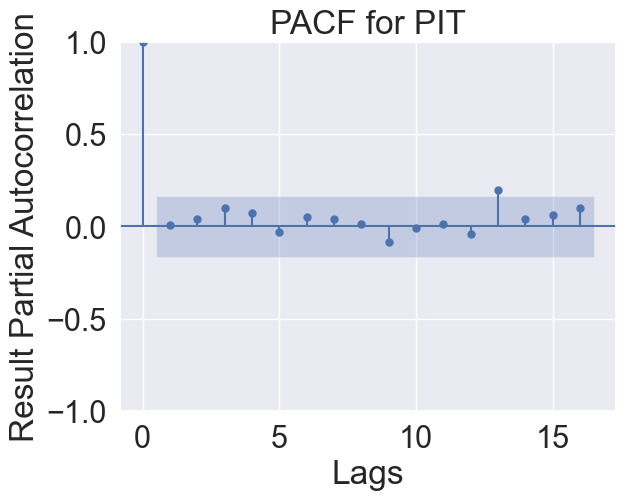

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

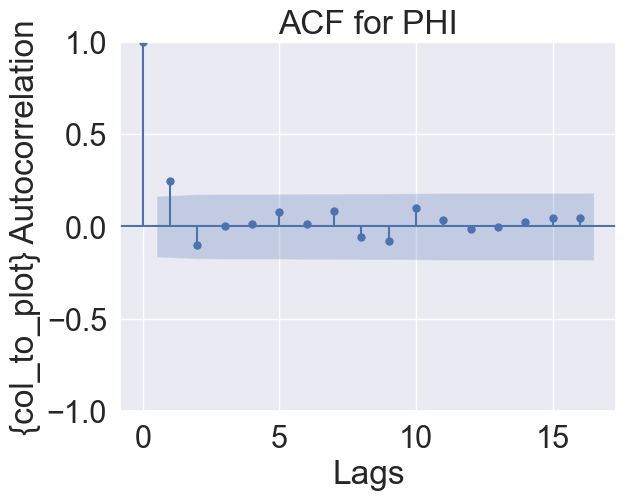

<Figure size 900x400 with 0 Axes>

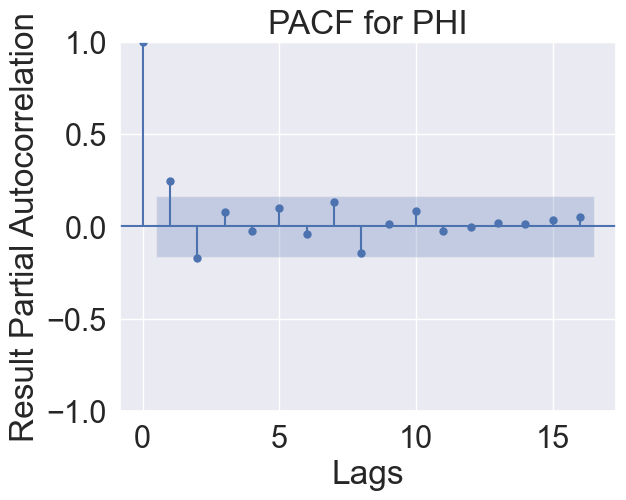

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

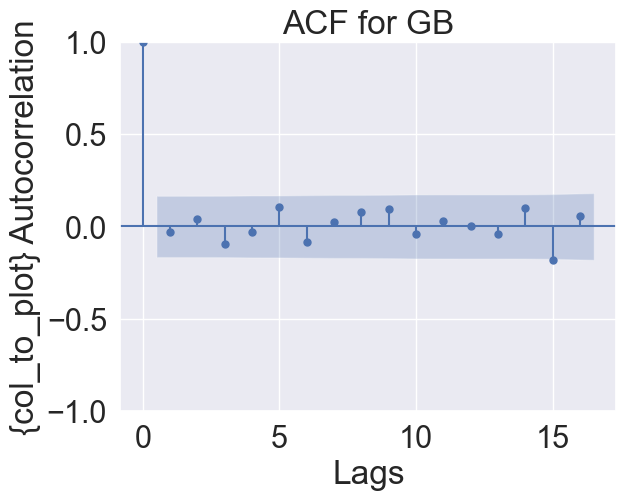

<Figure size 900x400 with 0 Axes>

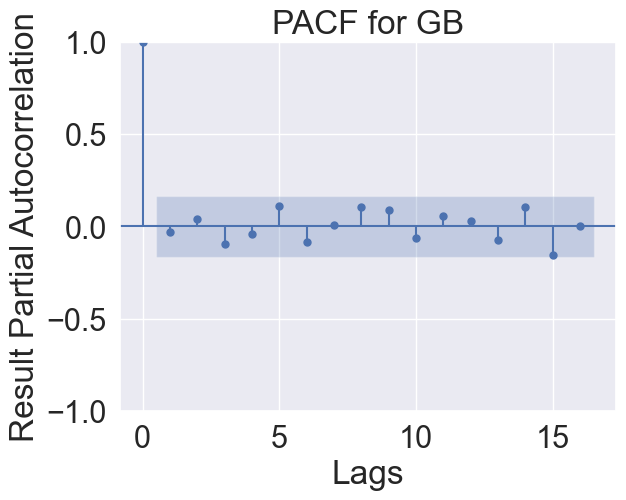

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

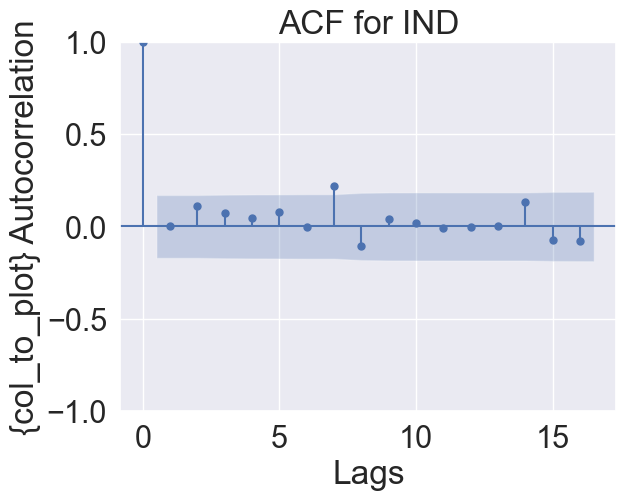

<Figure size 900x400 with 0 Axes>

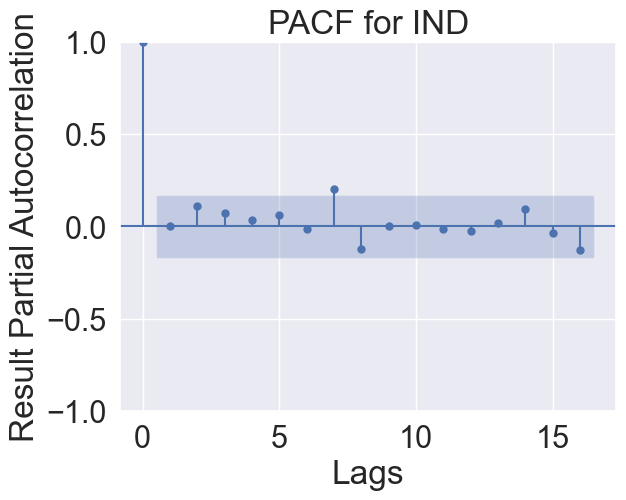

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

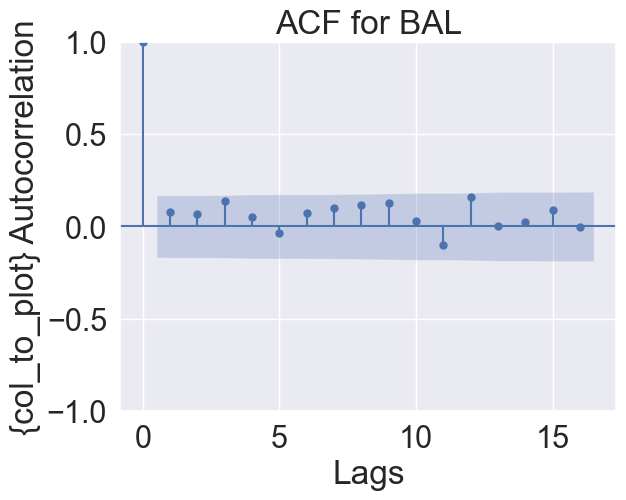

<Figure size 900x400 with 0 Axes>

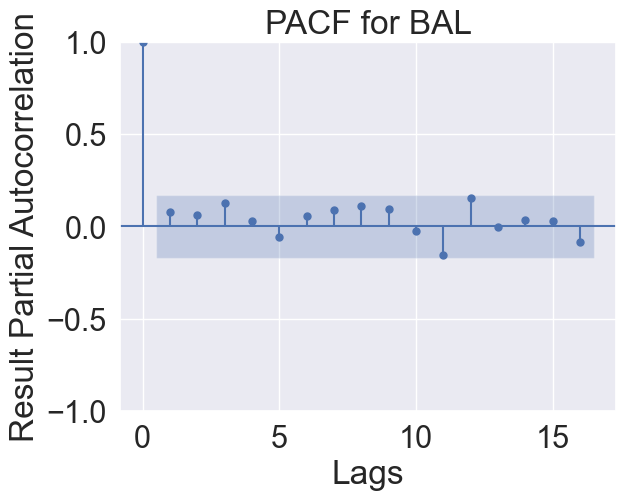

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

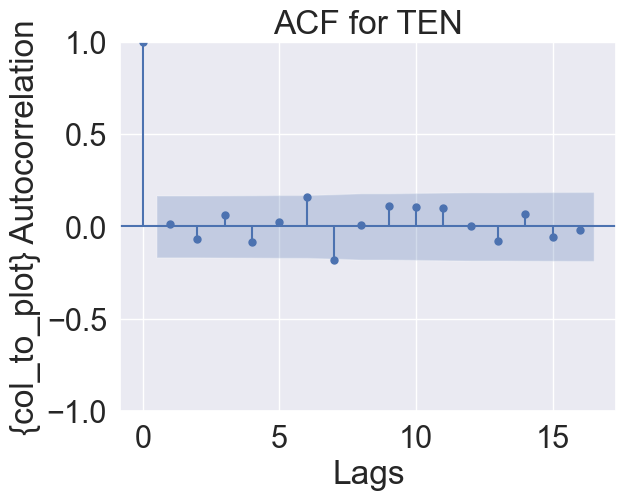

<Figure size 900x400 with 0 Axes>

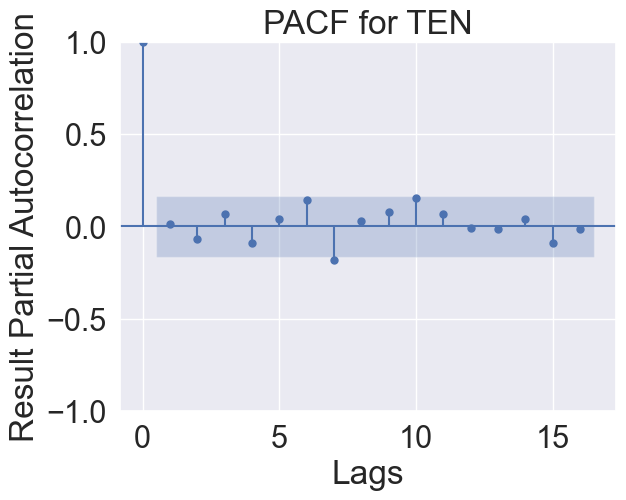

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

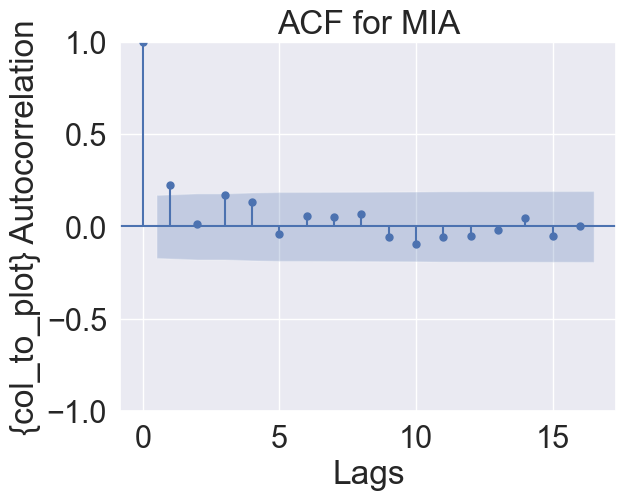

<Figure size 900x400 with 0 Axes>

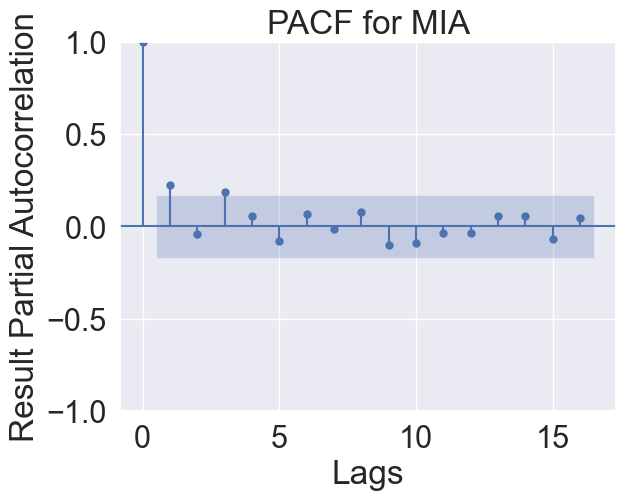

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

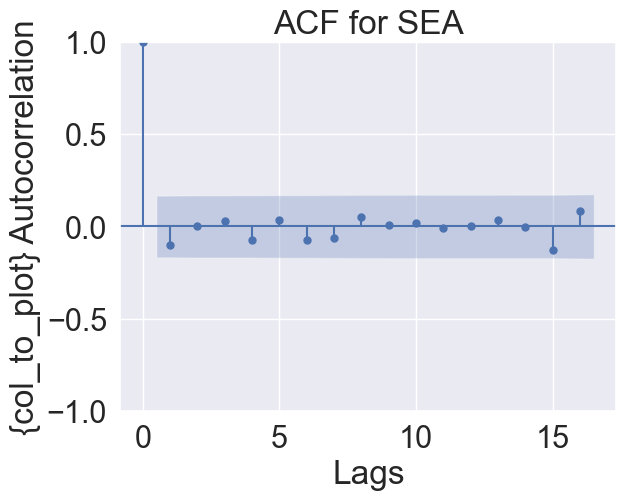

<Figure size 900x400 with 0 Axes>

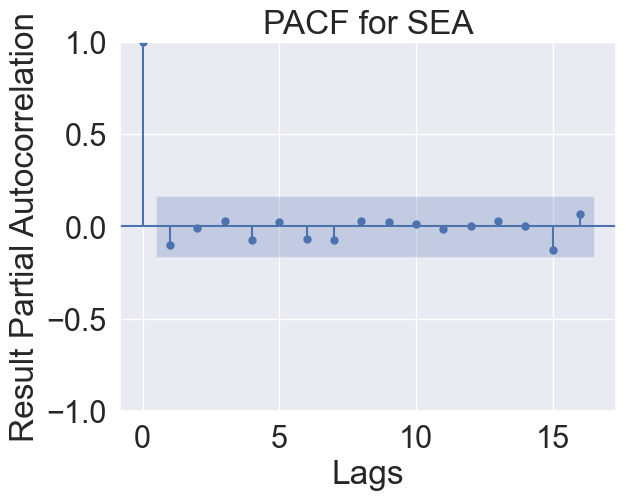

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

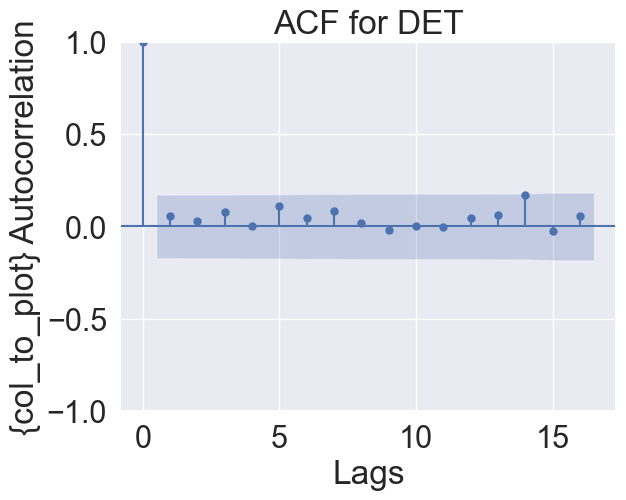

<Figure size 900x400 with 0 Axes>

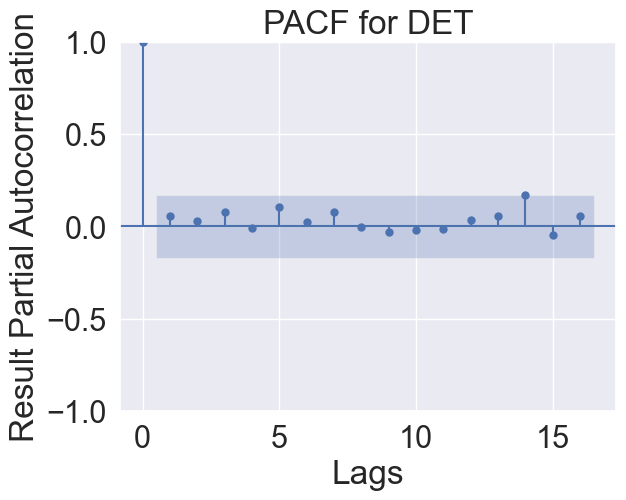

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

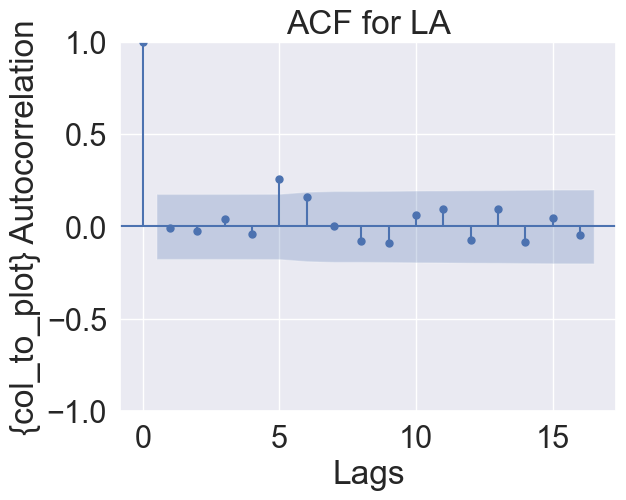

<Figure size 900x400 with 0 Axes>

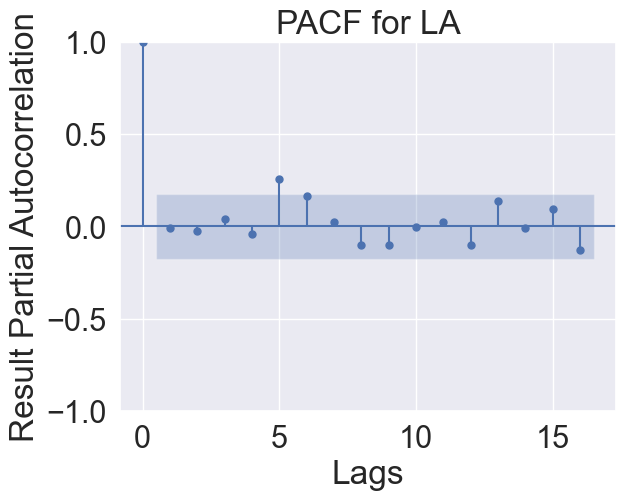

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

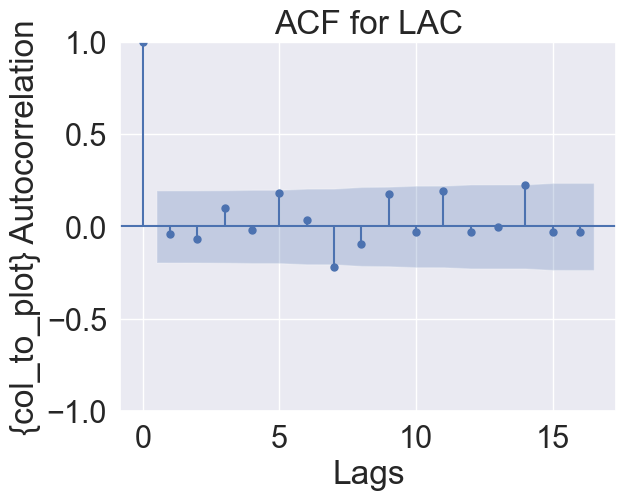

<Figure size 900x400 with 0 Axes>

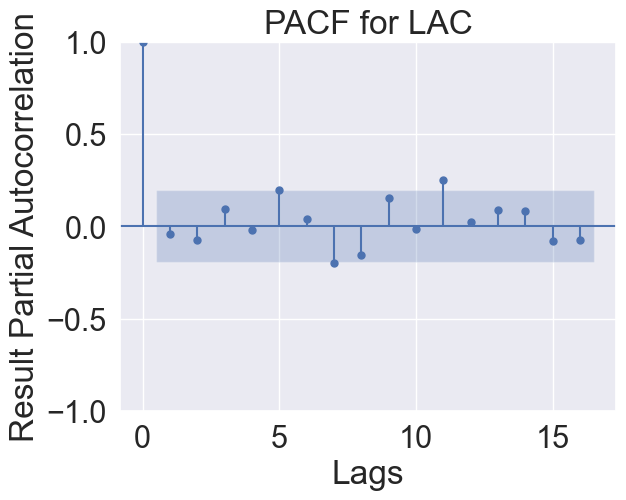

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

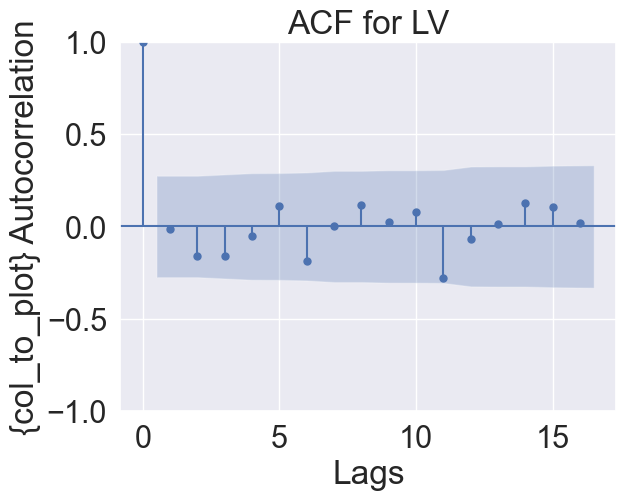

<Figure size 900x400 with 0 Axes>

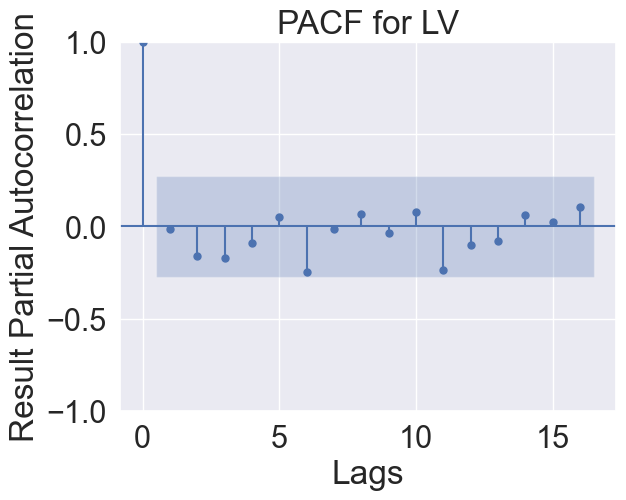

In [370]:
plot_auto_pauto(datetime_df, 'result')

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

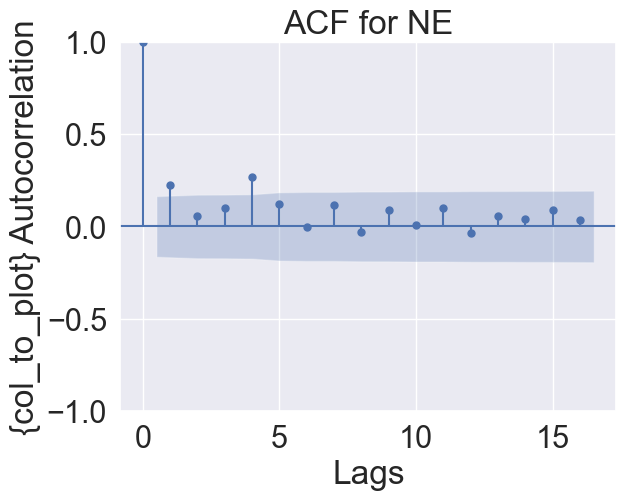

<Figure size 900x400 with 0 Axes>

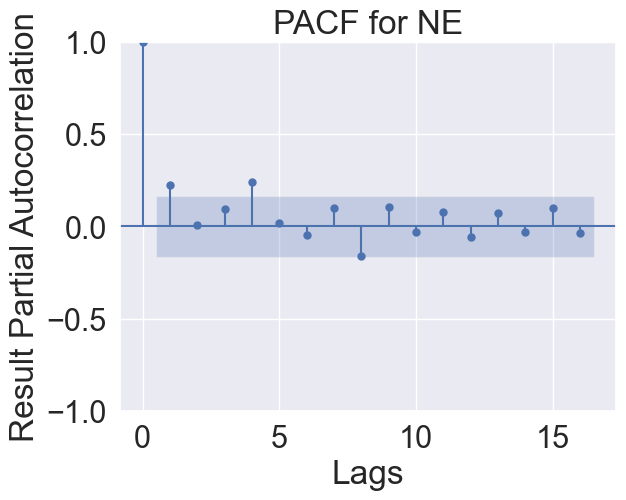

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

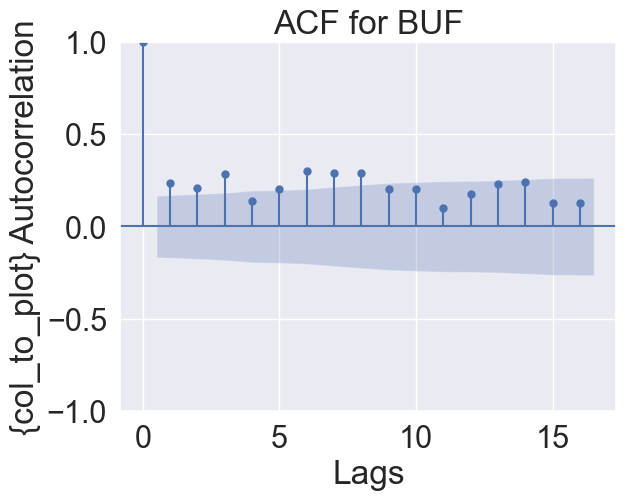

<Figure size 900x400 with 0 Axes>

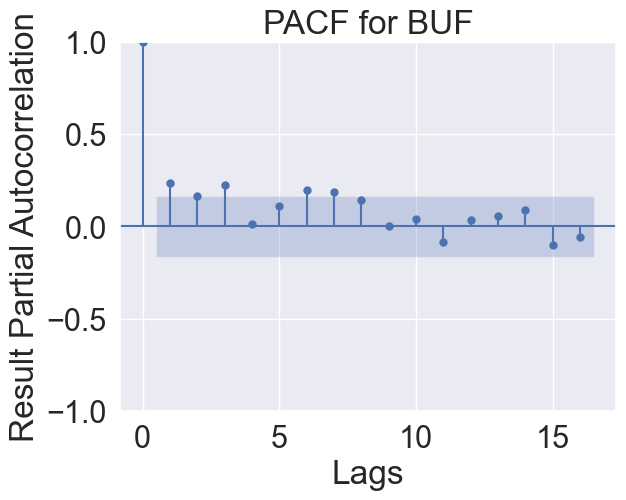

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

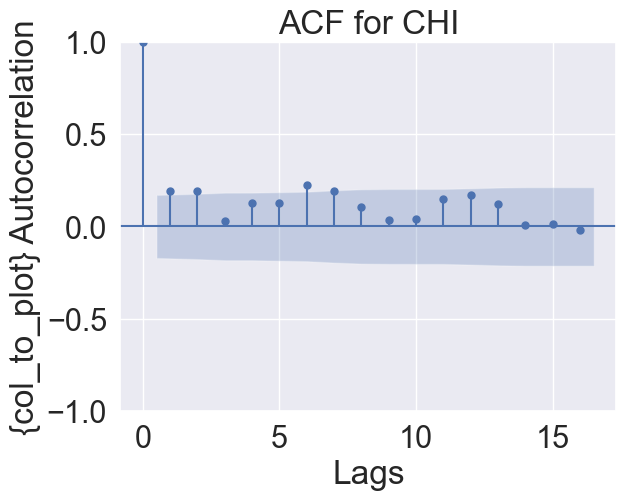

<Figure size 900x400 with 0 Axes>

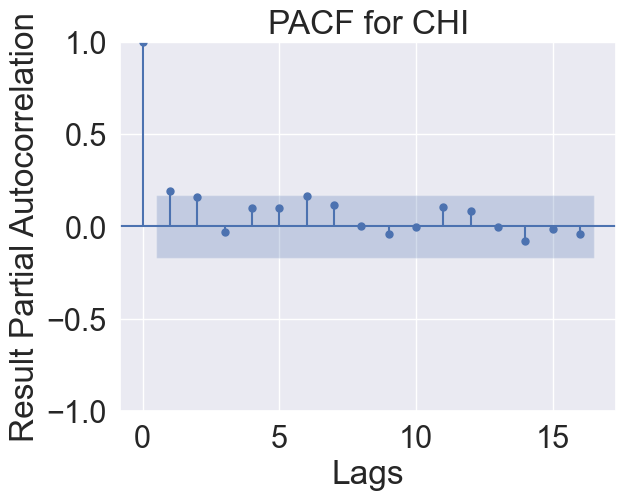

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

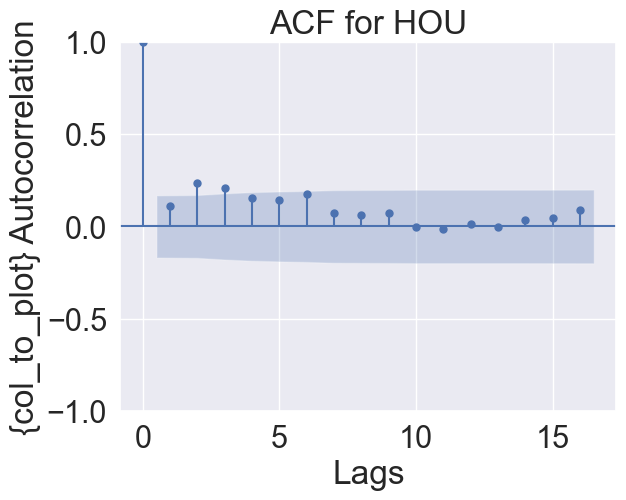

<Figure size 900x400 with 0 Axes>

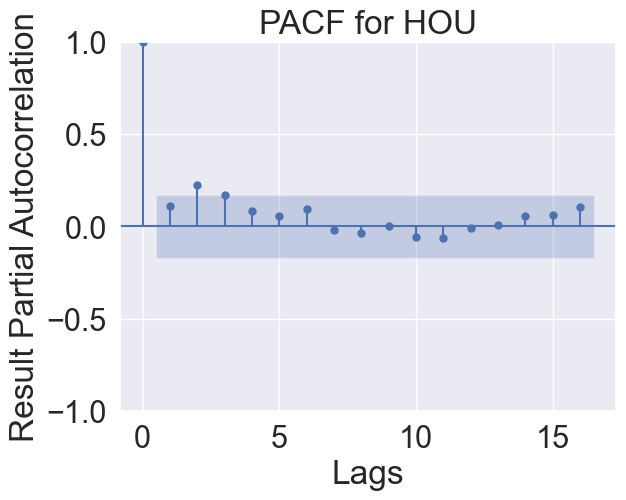

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

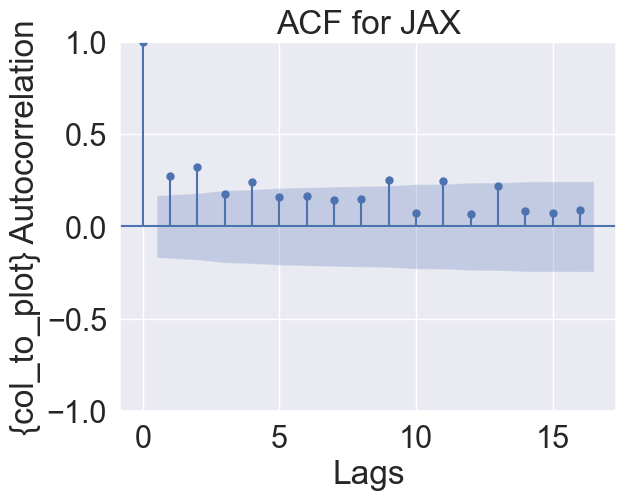

<Figure size 900x400 with 0 Axes>

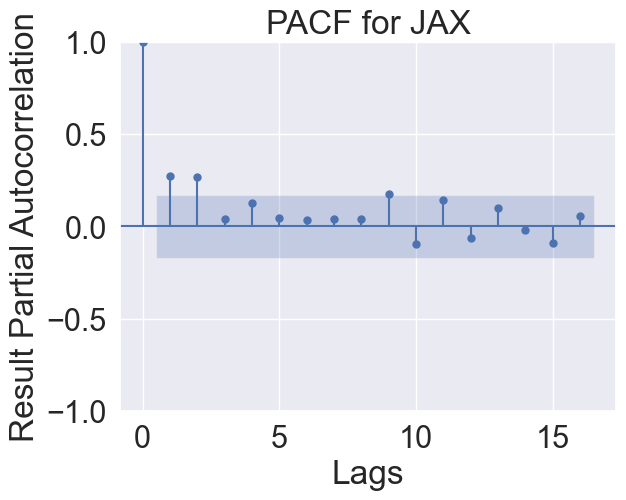

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

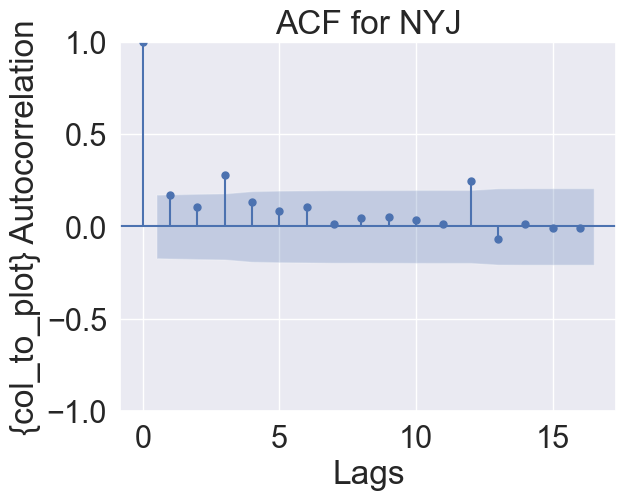

<Figure size 900x400 with 0 Axes>

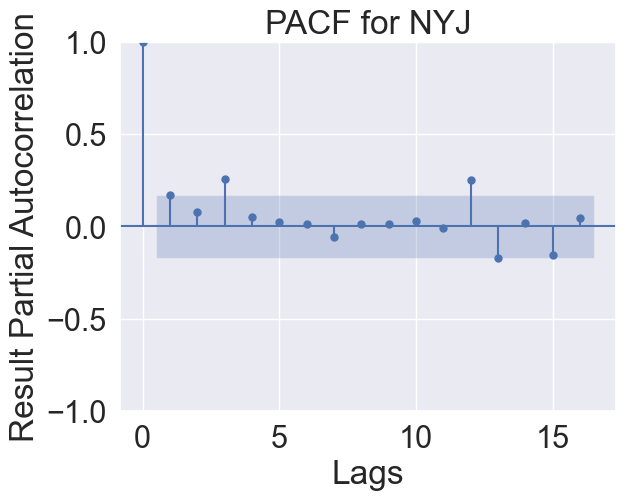

An error occurred while plotting: could not broadcast input array from shape (16,) into shape (17,)


/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

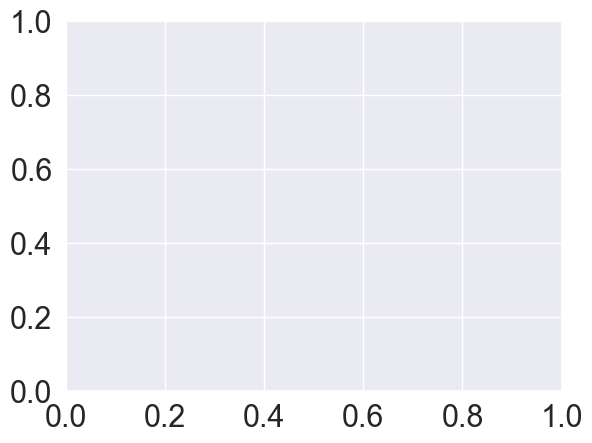

<Figure size 800x400 with 0 Axes>

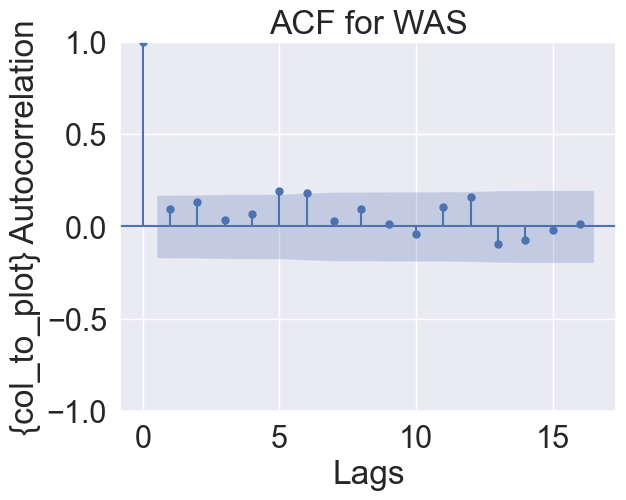

<Figure size 900x400 with 0 Axes>

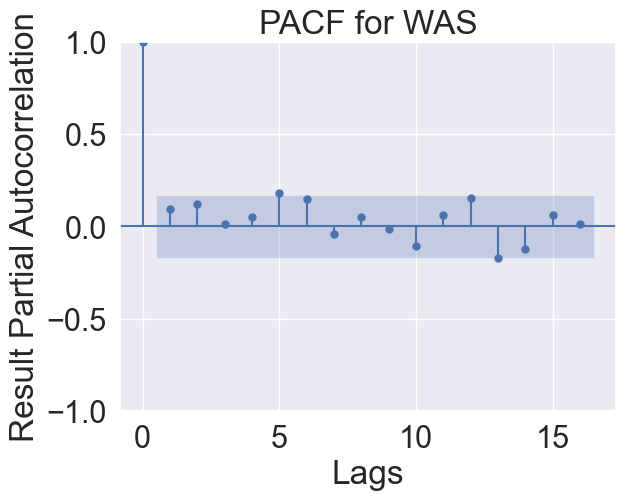

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

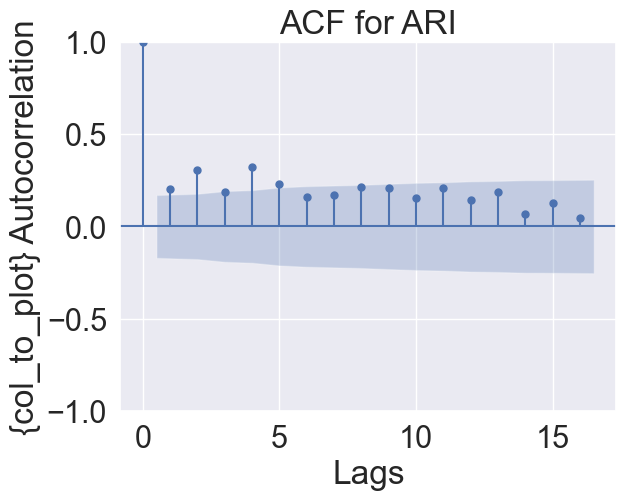

<Figure size 900x400 with 0 Axes>

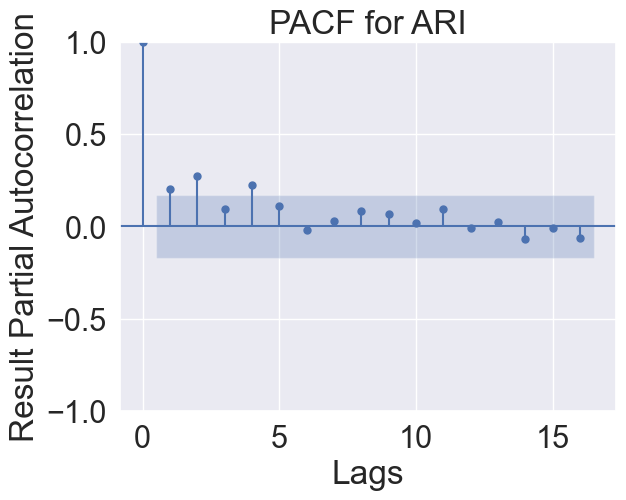

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

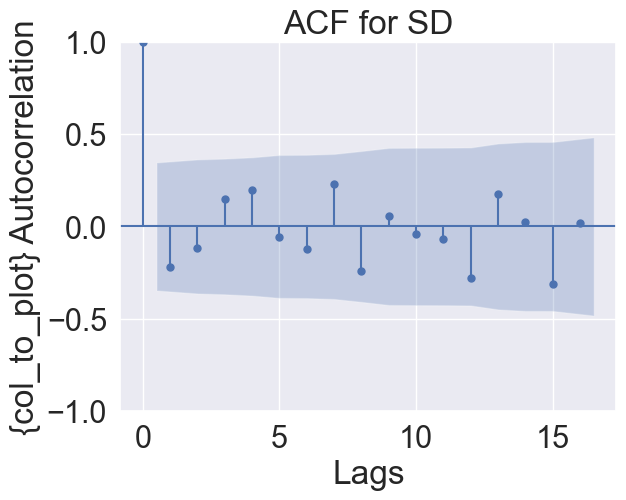

<Figure size 900x400 with 0 Axes>

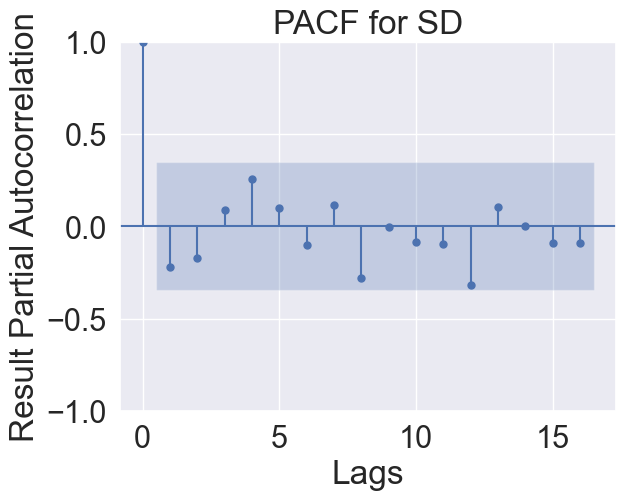

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

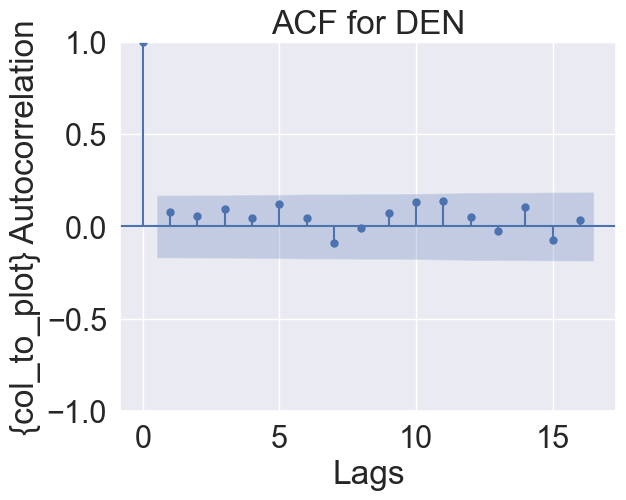

<Figure size 900x400 with 0 Axes>

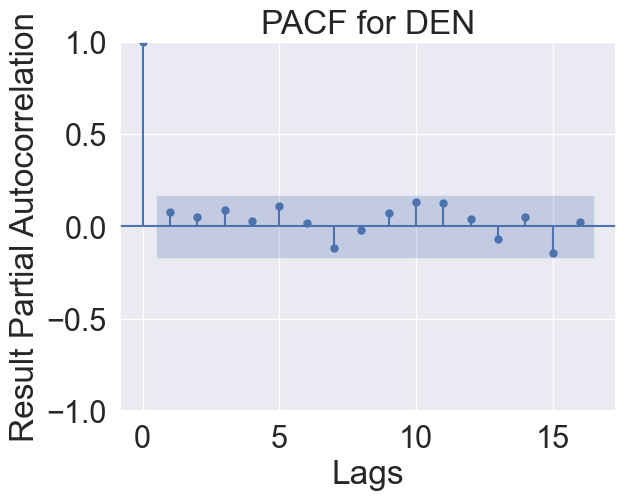

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

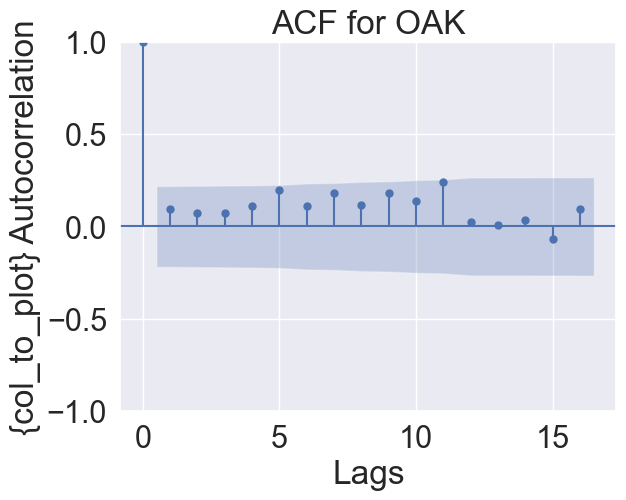

<Figure size 900x400 with 0 Axes>

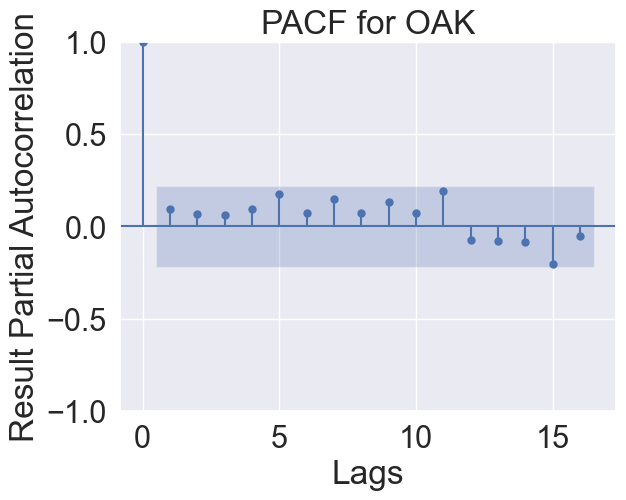

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

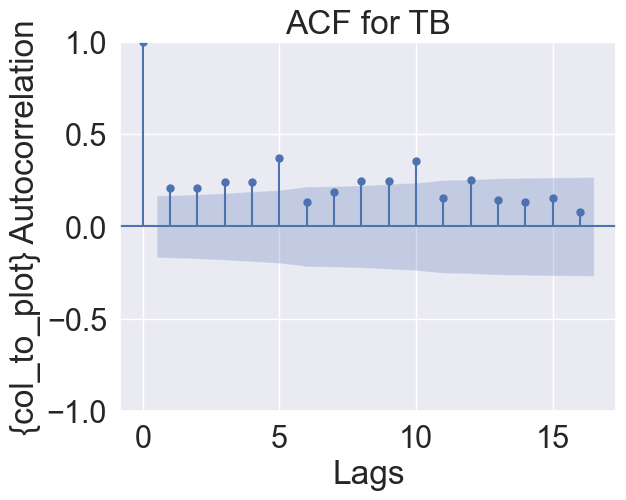

<Figure size 900x400 with 0 Axes>

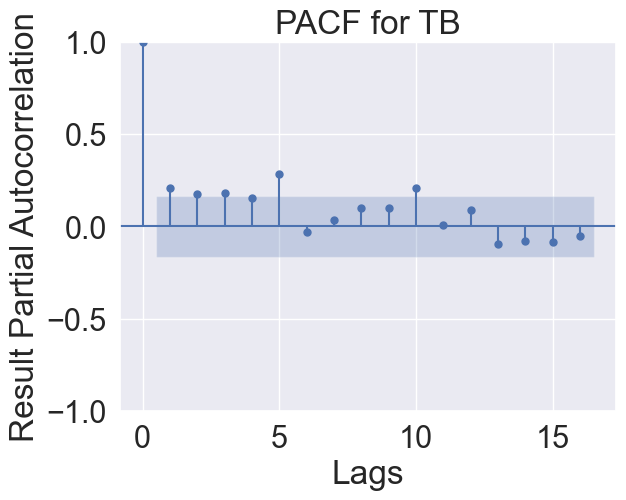

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

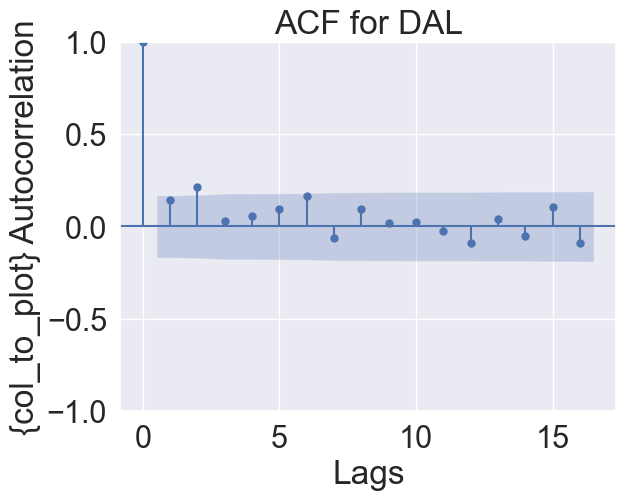

<Figure size 900x400 with 0 Axes>

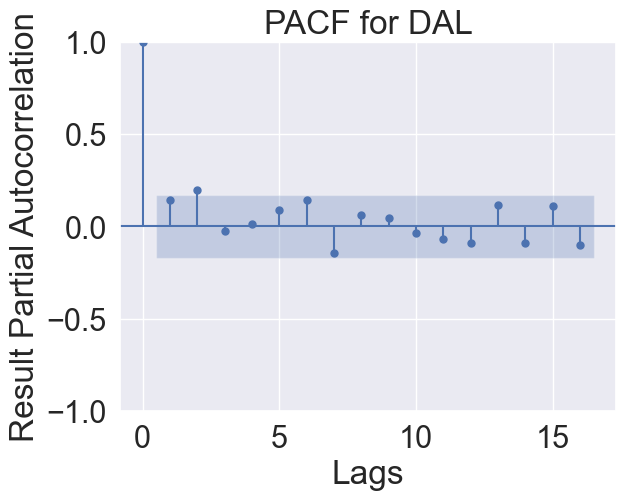

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

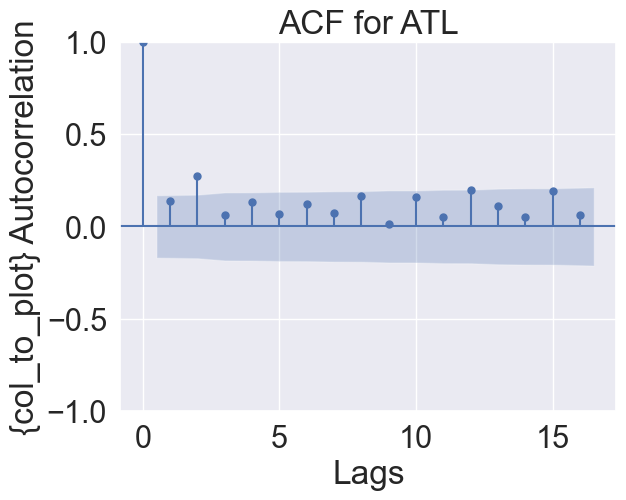

<Figure size 900x400 with 0 Axes>

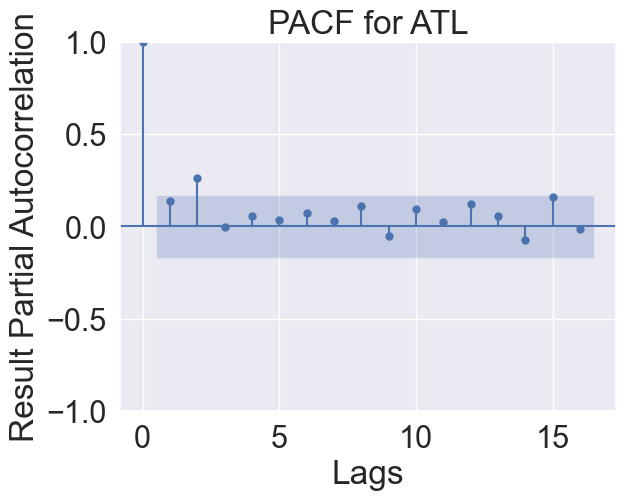

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

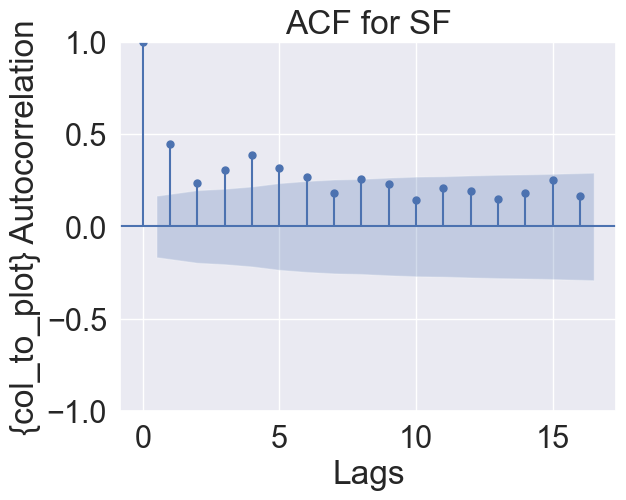

<Figure size 900x400 with 0 Axes>

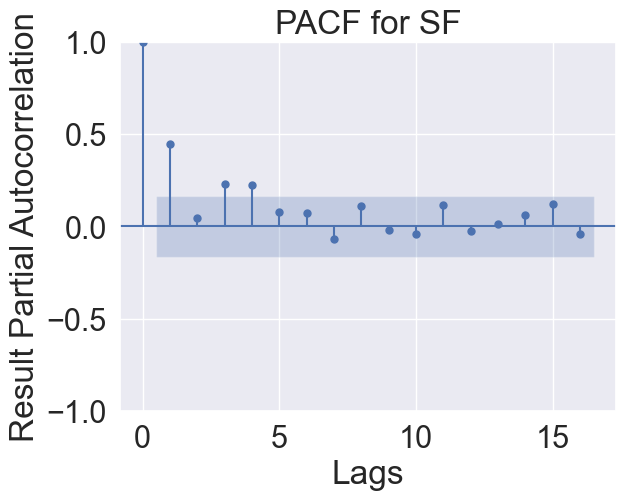

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

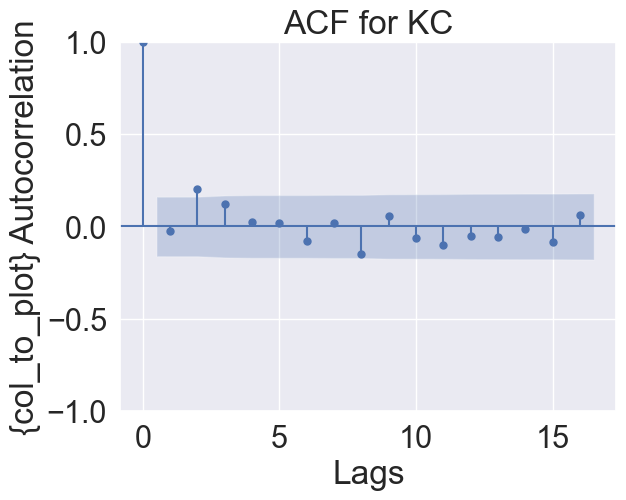

<Figure size 900x400 with 0 Axes>

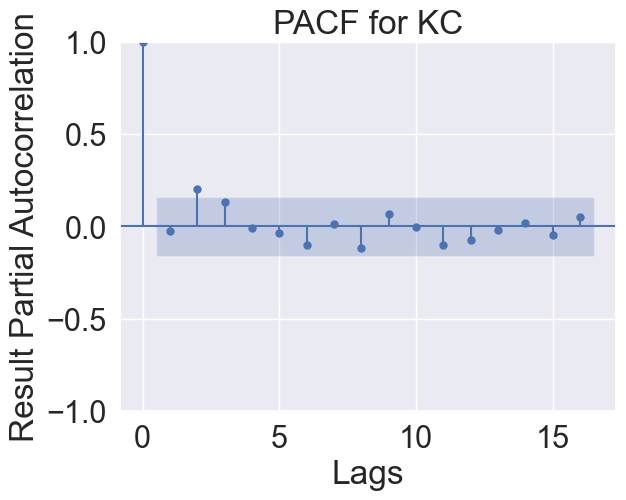

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

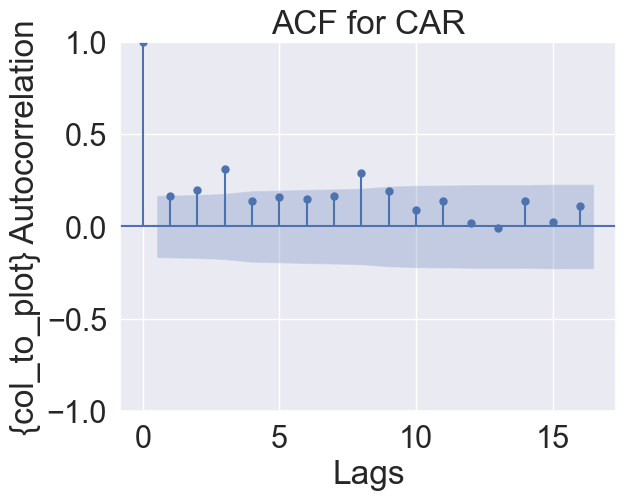

<Figure size 900x400 with 0 Axes>

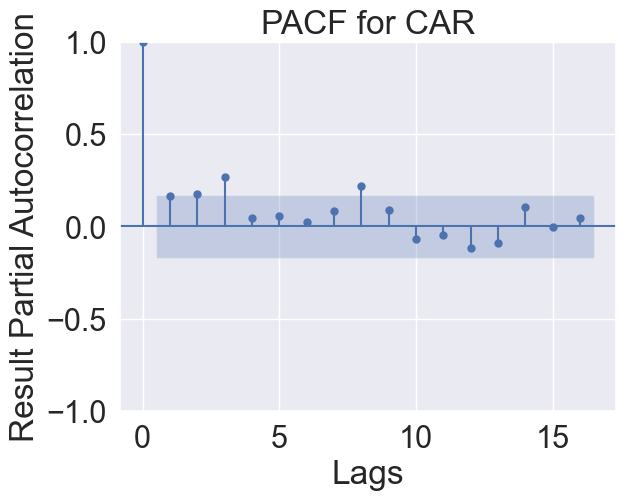

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

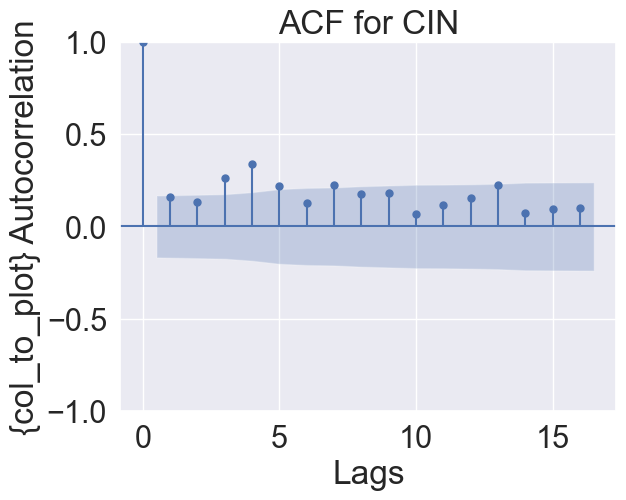

<Figure size 900x400 with 0 Axes>

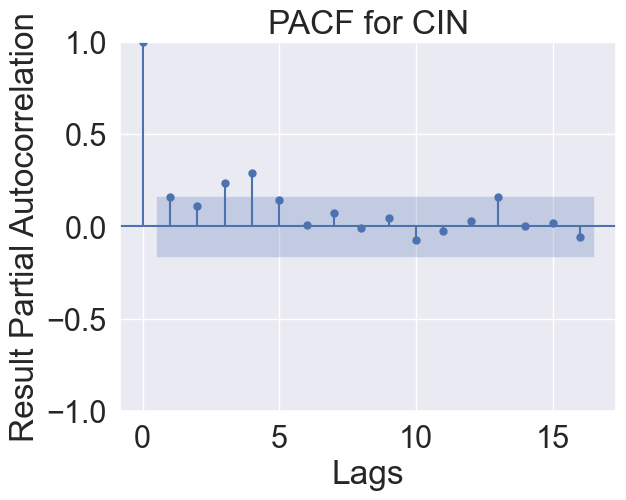

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

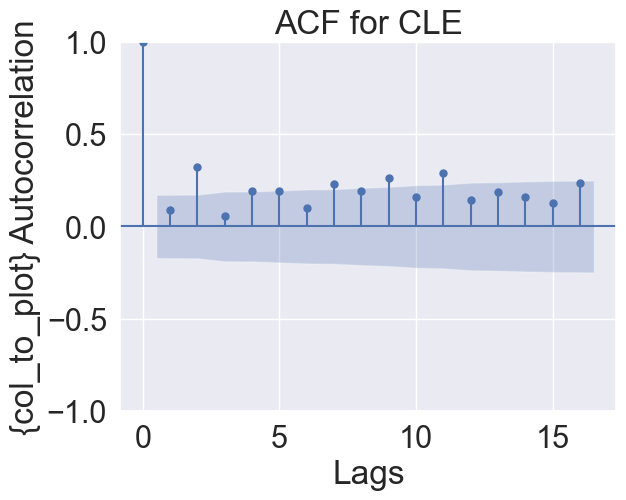

<Figure size 900x400 with 0 Axes>

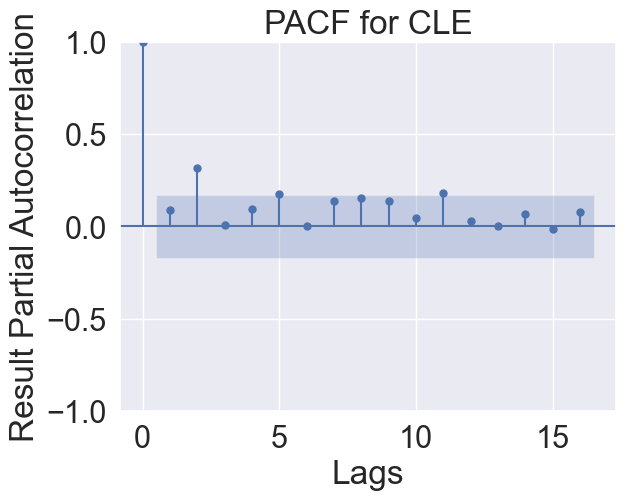

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

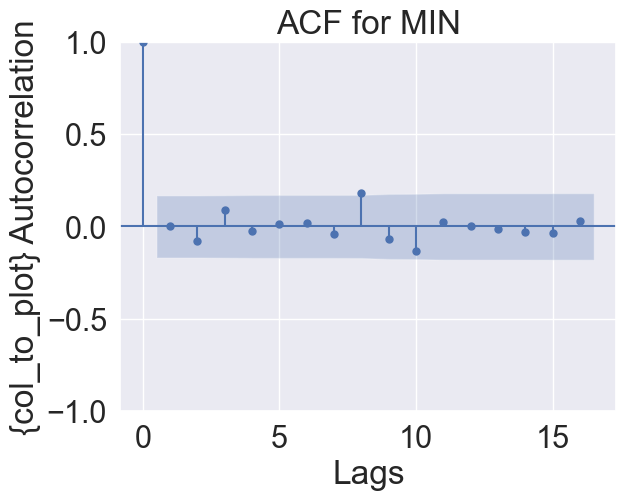

<Figure size 900x400 with 0 Axes>

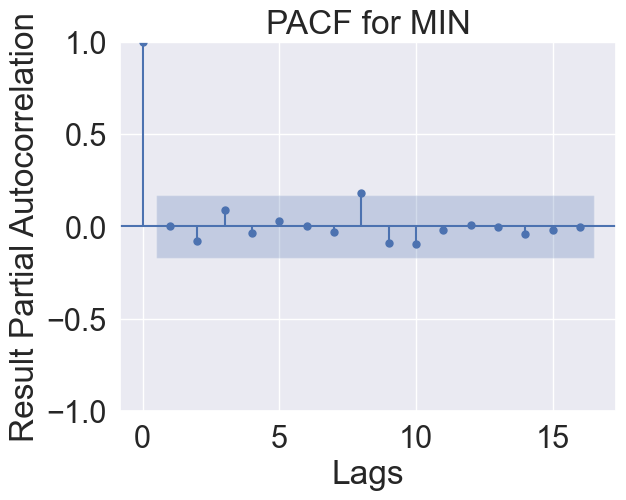

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

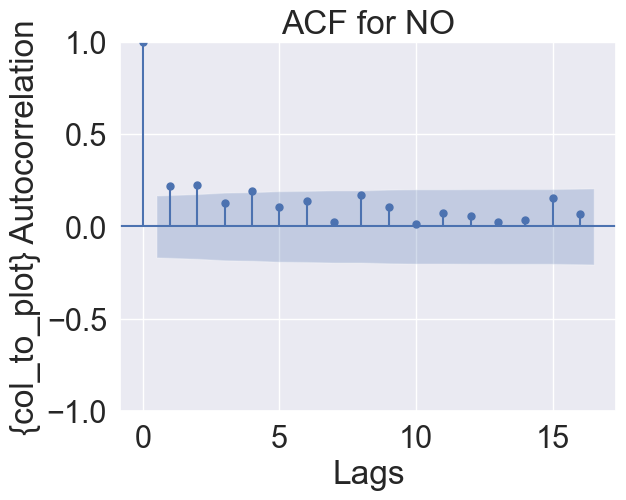

<Figure size 900x400 with 0 Axes>

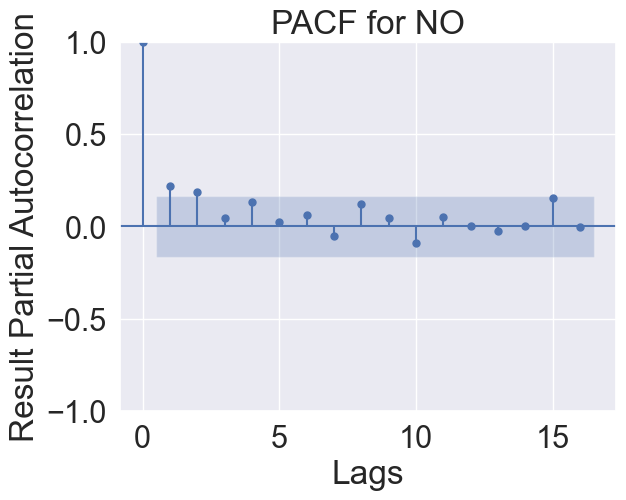

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

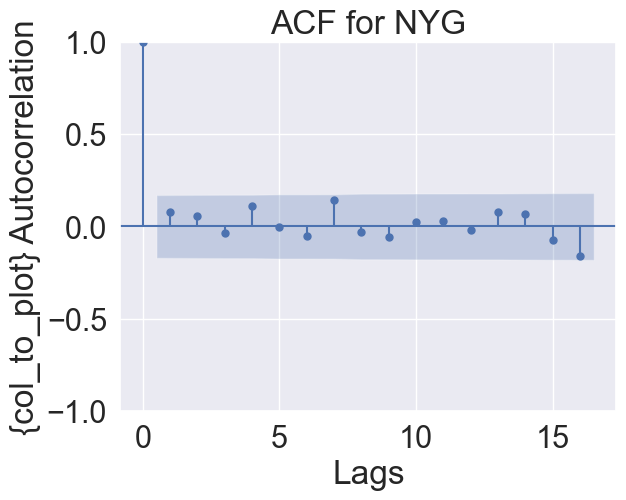

<Figure size 900x400 with 0 Axes>

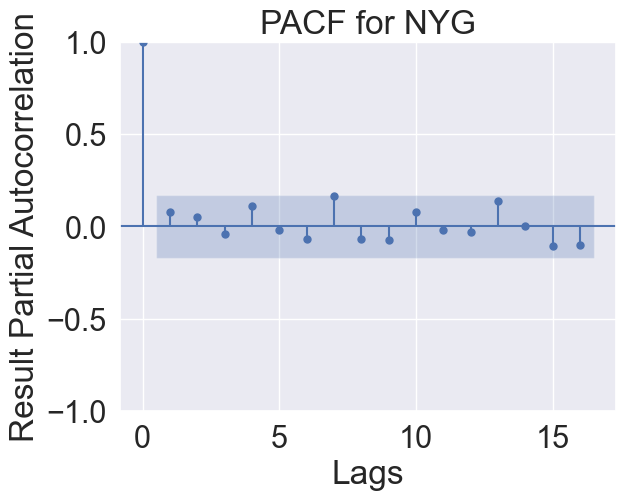

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

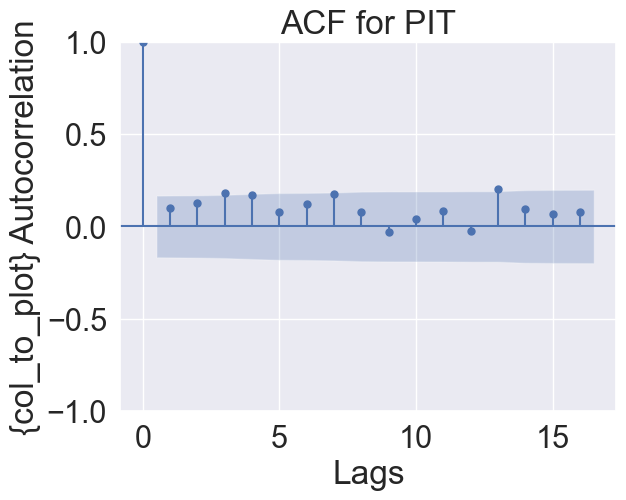

<Figure size 900x400 with 0 Axes>

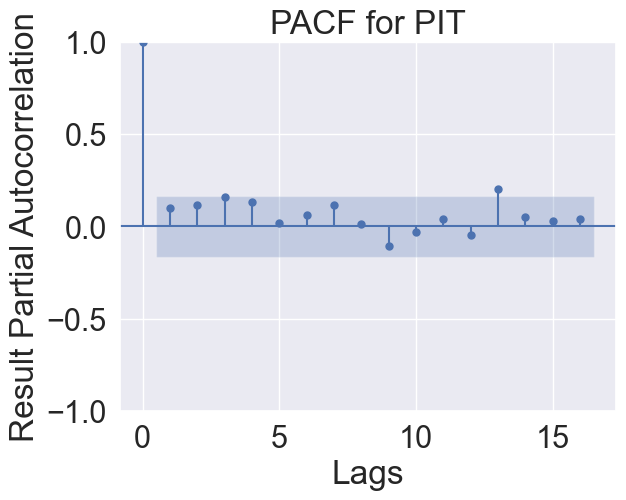

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

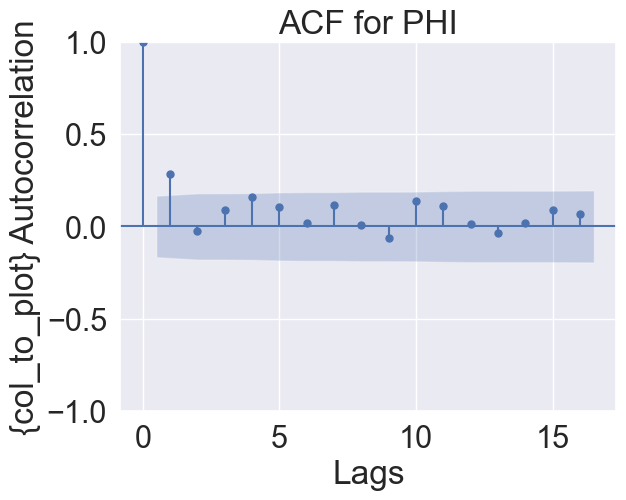

<Figure size 900x400 with 0 Axes>

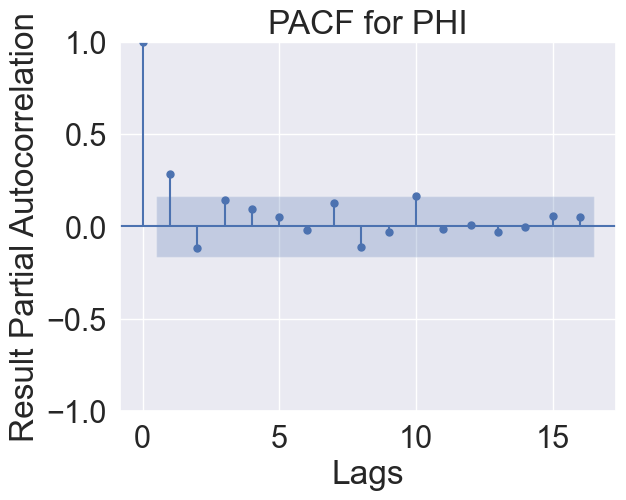

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

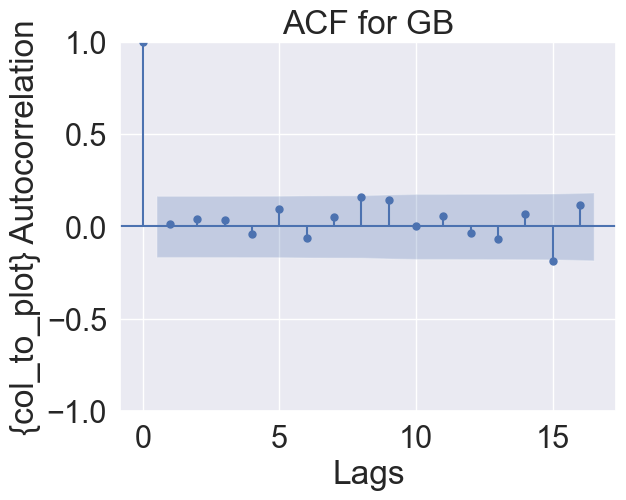

<Figure size 900x400 with 0 Axes>

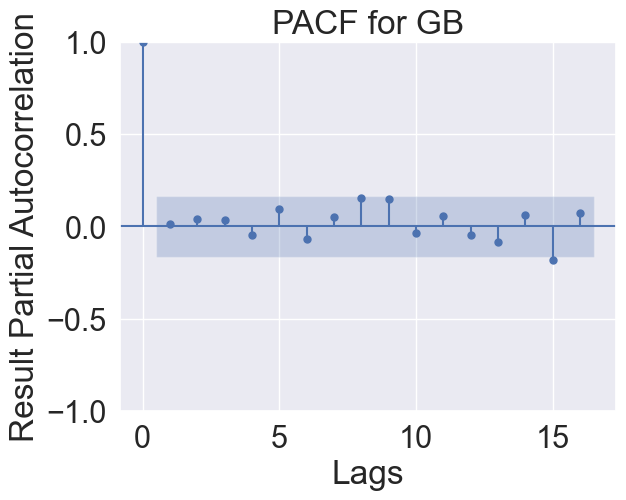

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

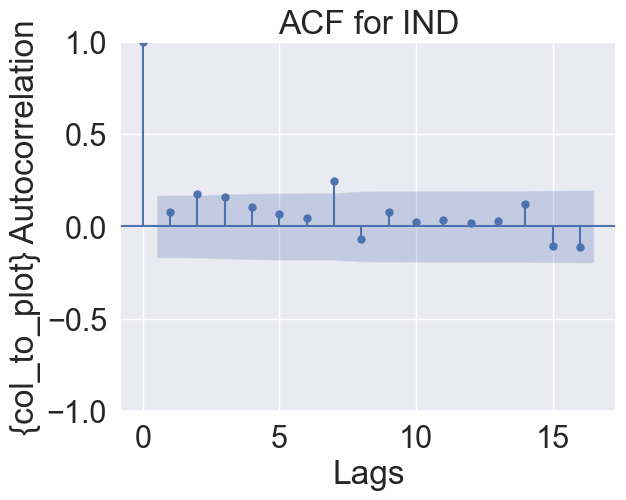

<Figure size 900x400 with 0 Axes>

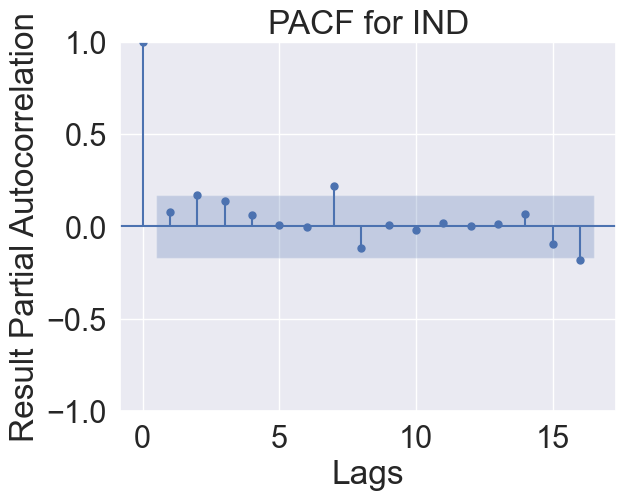

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

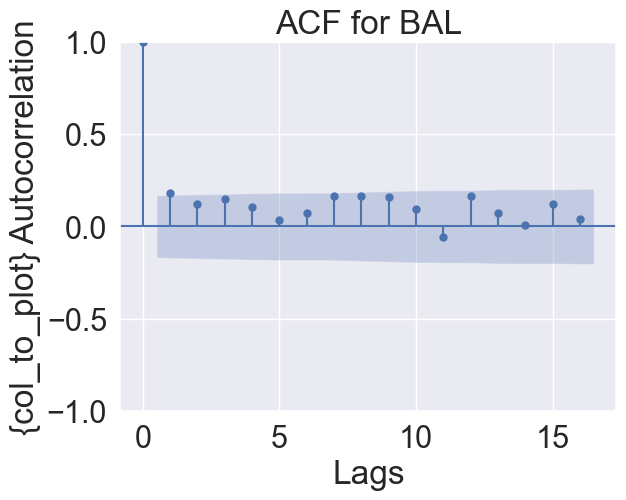

<Figure size 900x400 with 0 Axes>

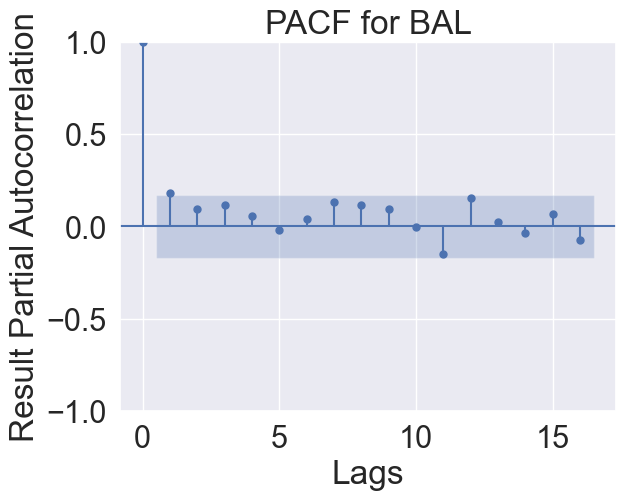

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

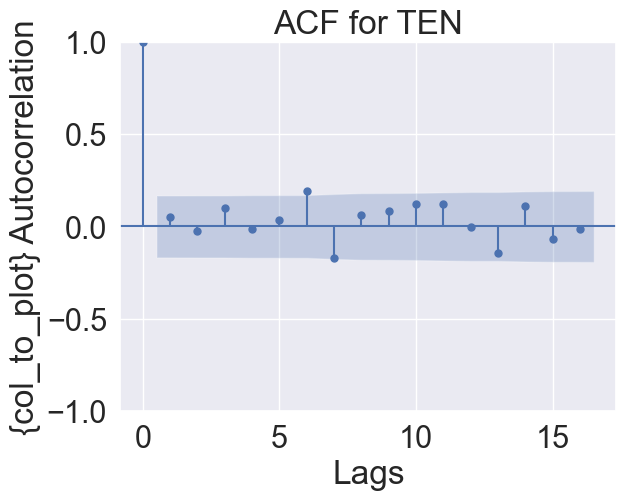

<Figure size 900x400 with 0 Axes>

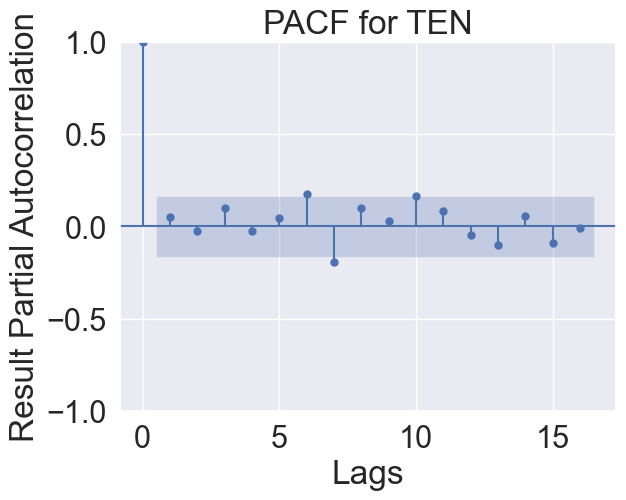

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

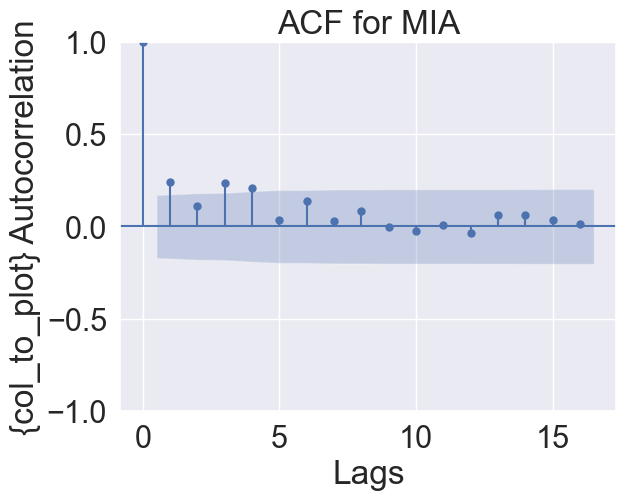

<Figure size 900x400 with 0 Axes>

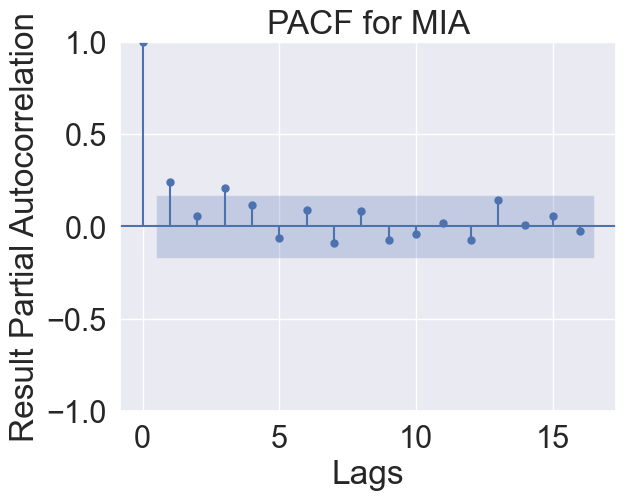

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

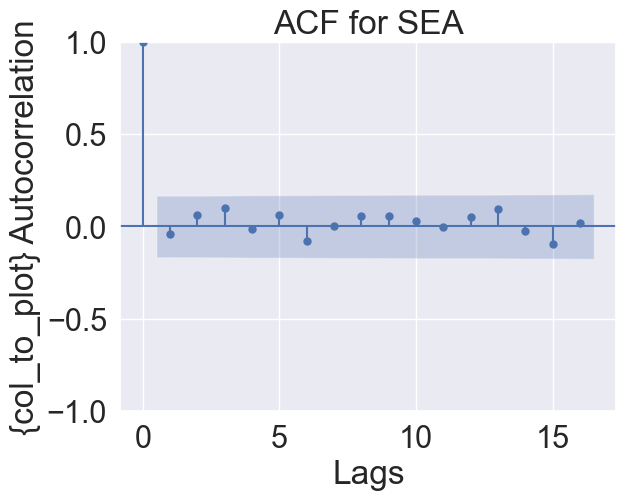

<Figure size 900x400 with 0 Axes>

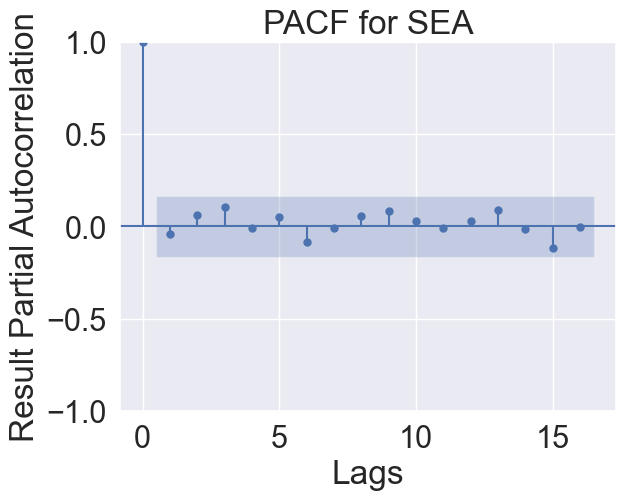

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

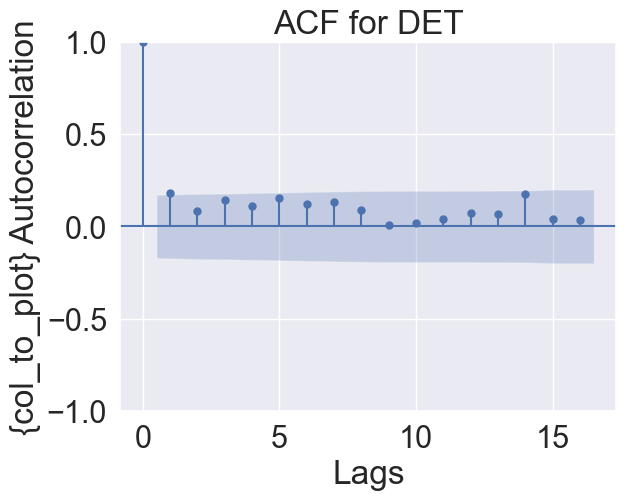

<Figure size 900x400 with 0 Axes>

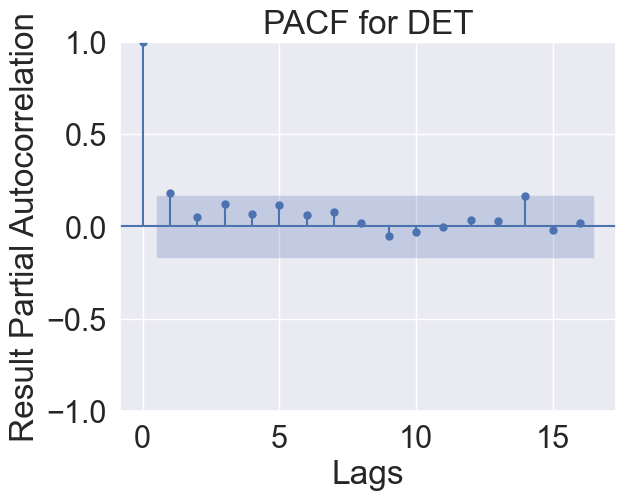

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

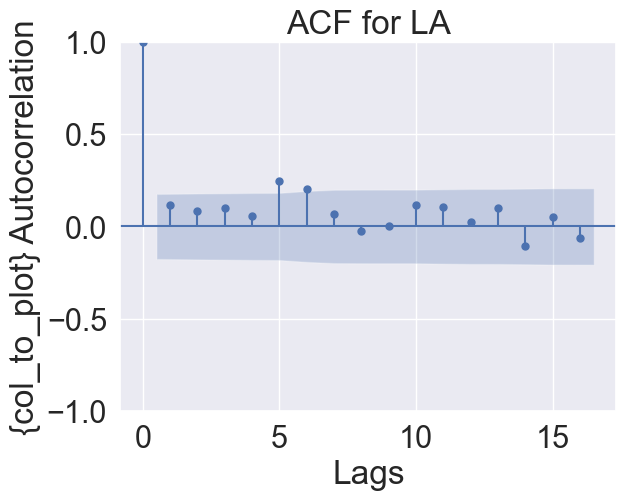

<Figure size 900x400 with 0 Axes>

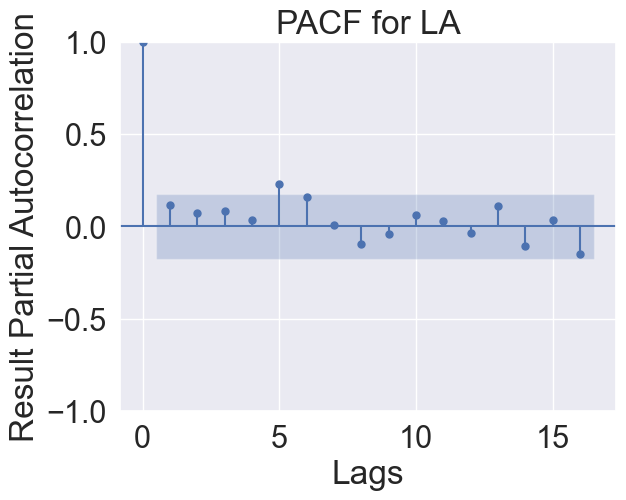

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

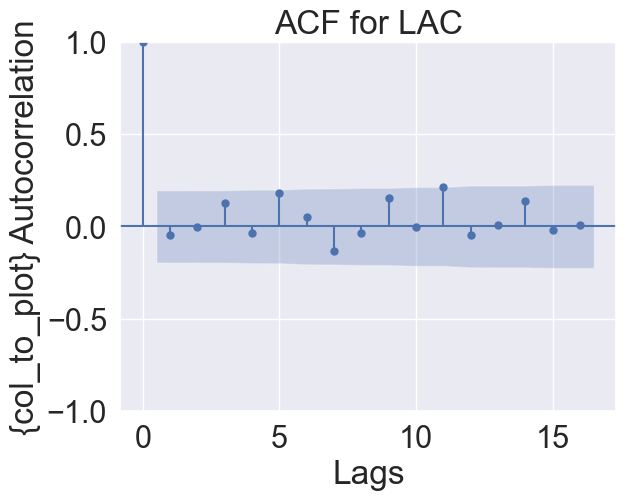

<Figure size 900x400 with 0 Axes>

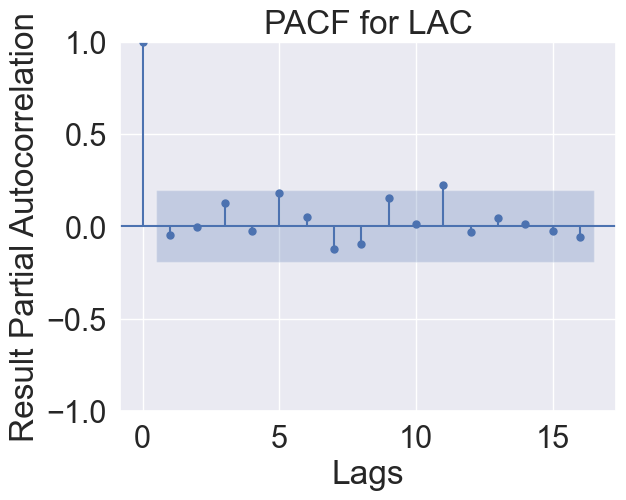

/tmp/ipykernel_18420/2840763905.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data.sort_values(by='datetime', inplace=True)


<Figure size 800x400 with 0 Axes>

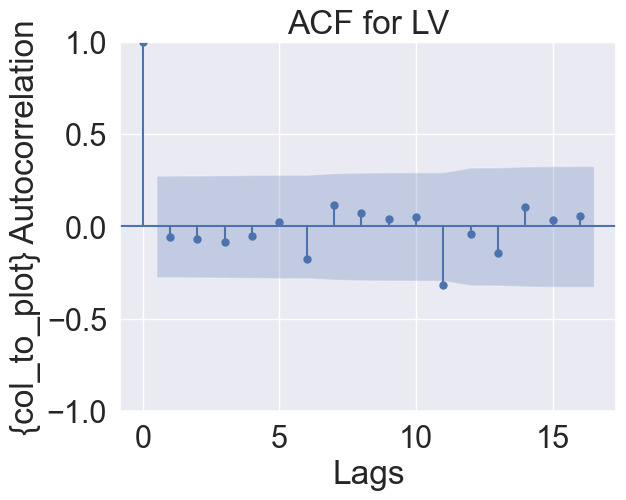

<Figure size 900x400 with 0 Axes>

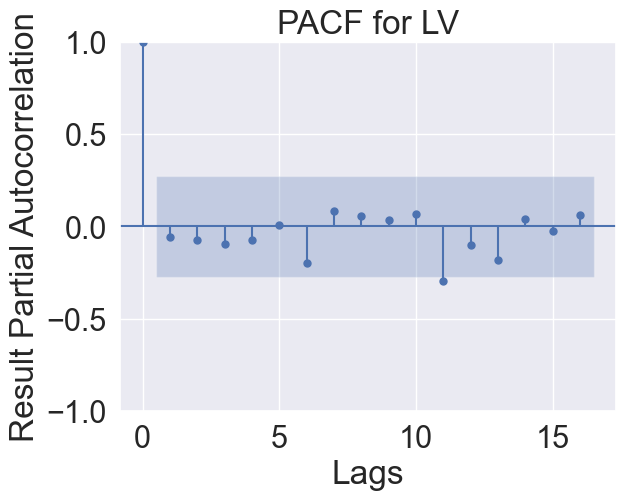

In [371]:
plot_auto_pauto(datetime_df, 'result_vs_spread')

# Feature Engineering and Final Data Prep

In [372]:
#Creating the 1 week lagged result vs spread variable
datetime_df.sort_values(by='datetime', inplace=True)

def add_lagged_rvs(df, lag_vars = [1]):
    for lag_var in lag_vars:
        lagged_col_name = f"-{lag_var}_lagged_result_vs_spread"
        df[lagged_col_name] = df.groupby('team')['result_vs_spread'].shift(lag_var)

    # Separate home and away teams
    df_home = df.loc[df['home_team_indicator'] == 1]
    df_away = df.loc[df['home_team_indicator'] != 1]

    # Rename columns for home and away teams
    df_home.rename(columns={'team': 'home_team'}, inplace=True)
    df_away.rename(columns={'team': 'away_team'}, inplace=True)

    # Merge the DataFrames based on 'game_id'
    result_df = pd.merge(df_home, df_away, on='game_id', suffixes=('_home', '_away'))
    # Drop the duplicate columns from the merge
    columns_to_drop = [
        'datetime_home', 'result_home', 'spread_line_home',
        'datetime_away', 'result_away', 'spread_line_away',
        'home_team_indicator_home', 'home_team_indicator_away',
        'result_vs_spread_home', 'result_vs_spread_away'
    ]

    result_df.drop(columns=columns_to_drop, axis=1, inplace=True)

    return result_df

In [373]:
result_df = add_lagged_rvs(datetime_df.copy(), lag_vars=[1])

/tmp/ipykernel_18420/3678564629.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home.rename(columns={'team': 'home_team'}, inplace=True)
/tmp/ipykernel_18420/3678564629.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_away.rename(columns={'team': 'away_team'}, inplace=True)


In [374]:
result_df.columns

Index(['home_team', 'game_id', '-1_lagged_result_vs_spread_home', 'away_team',
       '-1_lagged_result_vs_spread_away'],
      dtype='object')

In [384]:
cat_model_cols = ['home_team', 'away_team']

df1 = schedule[['game_id', 'result', 'spread_line', 'wind', 'temp'] + cat_model_cols]
model_df = pd.merge(df1, result_df, on=['game_id', 'home_team', 'away_team'], how="inner")

model_df = model_df.dropna().reset_index(drop=True)
model_df.drop(['game_id', 'home_team', 'away_team'], axis=1, inplace=True)
# model_df.drop(['game_id'], axis=1, inplace=True)

# model_df = pd.get_dummies(model_df, columns = cat_model_cols)

#trying adding another spreadline variable
# model_df['spread_line_squared'] = model_df['spread_line'] ** 2
# model_df['spread_line_diff_avg'] = model_df['spread_line'] - model_df['spread_line'].mean()

In [385]:
#train test split
X = model_df.drop('result', axis=1)
y = model_df['result']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modeling

In [386]:
def eval_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate the model's performance metrics
    mse_model = mean_squared_error(y_test, y_pred)
    r2_model = r2_score(y_test, y_pred)

    # Calculate the performance metrics for 'spread_line'
    mse_spread_line = mean_squared_error(y_test, X_test['spread_line'])
    r2_spread_line = r2_score(y_test, X_test['spread_line'])

    # Compare model performance to 'spread_line'
    better_than_spread_line = mse_model < mse_spread_line

    # Print the results
    print(f"Model MSE: {mse_model}, R-squared: {r2_model}")
    print(f"Spread Line MSE: {mse_spread_line}, R-squared: {r2_spread_line}")
    print(f"Model is a better predictor than Spread Line: {better_than_spread_line}")
    return model

### Linear Regression

In [387]:
model = LinearRegression()
model = eval_model(model, X_train, X_test, y_train, y_test)

Model MSE: 145.77727809261262, R-squared: 0.1880237431706422
Spread Line MSE: 145.88515081206498, R-squared: 0.18742289447802718
Model is a better predictor than Spread Line: True


### XGboost 

In [320]:

# Train a boosted model (Gradient Boosting Regressor)
model = GradientBoostingRegressor(n_estimators=100, random_state=42)

model = eval_model(model, X_train, X_test, y_train, y_test)

Model MSE: 150.3806268619403, R-squared: 0.17252037180244784
Spread Line MSE: 144.44906323185012, R-squared: 0.20515920414195687
Model is a better predictor than Spread Line: False


In [307]:
feature_importance = model.feature_importances_

# Get the names of the features (columns)
feature_names = model_df.drop('result', axis=1).columns  # Replace df1 with your feature DataFrame

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df)

                           Feature  Importance
0                      spread_line    0.607228
6  -2_lagged_result_vs_spread_away    0.097029
5  -1_lagged_result_vs_spread_away    0.082363
3  -1_lagged_result_vs_spread_home    0.071047
4  -2_lagged_result_vs_spread_home    0.064107
2                             temp    0.056623
1                             wind    0.021602


### Random Forest

In [308]:
model = RandomForestRegressor(n_estimators=100, random_state=42)

model = eval_model(model, X_train, X_test, y_train, y_test)

Model MSE: 159.57847330210774, R-squared: 0.12190859612794303
Spread Line MSE: 144.44906323185012, R-squared: 0.20515920414195687
Model is a better predictor than Spread Line: False


In [309]:
feature_importance = model.feature_importances_

# Get the names of the features (columns)
feature_names = model_df.drop('result', axis=1).columns  # Replace df1 with your feature DataFrame

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df)

                           Feature  Importance
0                      spread_line    0.272089
6  -2_lagged_result_vs_spread_away    0.146036
5  -1_lagged_result_vs_spread_away    0.143237
3  -1_lagged_result_vs_spread_home    0.138356
4  -2_lagged_result_vs_spread_home    0.133701
2                             temp    0.097667
1                             wind    0.068914


In [388]:
schedule

,game_id,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,...,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium,datetime
0,2015_01_PIT_NE,2015,REG,1,2015-09-10,Thursday,20:30,PIT,21.0,NE,...,00-0022924,00-0019596,Ben Roethlisberger,Tom Brady,Mike Tomlin,Bill Belichick,Carl Cheffers,BOS00,Gillette Stadium,2015-09-10 20:30:00
1,2015_01_IND_BUF,2015,REG,1,2015-09-13,Sunday,13:00,IND,14.0,BUF,...,00-0029668,00-0028118,Andrew Luck,Tyrod Taylor,Chuck Pagano,Rex Ryan,John Parry,BUF00,Ralph Wilson Stadium,2015-09-13 13:00:00
2,2015_01_GB_CHI,2015,REG,1,2015-09-13,Sunday,13:00,GB,31.0,CHI,...,00-0023459,00-0024226,Aaron Rodgers,Jay Cutler,Mike McCarthy,John Fox,Craig Wrolstad,CHI98,Soldier Field,2015-09-13 13:00:00
3,2015_01_KC_HOU,2015,REG,1,2015-09-13,Sunday,13:00,KC,27.0,HOU,...,00-0023436,00-0026625,Alex Smith,Brian Hoyer,Andy Reid,Bill O'Brien,Peter Morelli,HOU00,NRG Stadium,2015-09-13 13:00:00
4,2015_01_CAR_JAX,2015,REG,1,2015-09-13,Sunday,13:00,CAR,20.0,JAX,...,00-0027939,00-0031407,Cam Newton,Blake Bortles,Ron Rivera,Gus Bradley,Ron Torbert,JAX00,EverBank Field,2015-09-13 13:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2168,2022_20_CIN_BUF,2022,DIV,20,2023-01-22,Sunday,15:00,CIN,27.0,BUF,...,00-0036442,00-0034857,Joe Burrow,Josh Allen,Zac Taylor,Sean McDermott,Carl Cheffers,BUF00,New Era Field,2023-01-22 15:00:00
2169,2022_20_DAL_SF,2022,DIV,20,2023-01-22,Sunday,18:30,DAL,12.0,SF,...,00-0033077,00-0037834,Dak Prescott,Brock Purdy,Mike McCarthy,Kyle Shanahan,Bill Vinovich,SFO01,Levi's Stadium,2023-01-22 18:30:00
2170,2022_21_SF_PHI,2022,CON,21,2023-01-29,Sunday,15:00,SF,7.0,PHI,...,00-0037834,00-0036389,Brock Purdy,Jalen Hurts,Kyle Shanahan,Nick Sirianni,John Hussey,PHI00,Lincoln Financial Field,2023-01-29 15:00:00
2171,2022_21_CIN_KC,2022,CON,21,2023-01-29,Sunday,18:30,CIN,20.0,KC,...,00-0036442,00-0033873,Joe Burrow,Patrick Mahomes,Zac Taylor,Andy Reid,Ron Torbert,KAN00,GEHA Field at Arrowhead Stadium,2023-01-29 18:30:00
